<a href="https://colab.research.google.com/github/yongxuantan/Kaggle/blob/master/Huge_Stock_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

original notebook by https://www.kaggle.com/kratisaxena/stock-market-technical-indicators-visualization

- Stock Technical Indicators:
  - Relative Strength Index (RSI)
  - Bollinger Bands
  - Aroon Oscillator
  - Price Volume Trend
  - Acceleration Bands
  - Stochastic Oscillator (%K and %D)
  - Chaikin Money Flow
  - Parabolic SAR
  - Price Rate of Change
  - Volume Weighted Average Price
  - Momentum
  - Triple Exponential Moving Average
  - Commodity Channel Index
  - On Balance Volume
  - Keltner Channels
  - Normalized Average True Range
  - Average Directional Movement Index (ADX)
  - Money Flow Index
  - Ichimoku Cloud
  - William %R
  - MINMAX
  - MACD
  - Adaptive Moving Average

In [1]:
# Colab library to upload files to notebook
from google.colab import files

# Install Kaggle library
!pip install -q kaggle

# Upload kaggle API key file
uploaded = files.upload()

Saving kaggle.json to kaggle.json


## Setup and download data

In [2]:
# make directory to store kaggle key
!mkdir ~/.kaggle

# copy kaggle key over
!cp kaggle.json ~/.kaggle/

# adjust permission
!chmod 600 /root/.kaggle/kaggle.json

In [3]:
# list files in dataset
!kaggle datasets list -s huge-stock-market

ref                                                         title                                              size  lastUpdated          downloadCount  
----------------------------------------------------------  -----------------------------------------------  ------  -------------------  -------------  
borismarjanovic/price-volume-data-for-all-us-stocks-etfs    Huge Stock Market Dataset                         492MB  2017-11-16 14:53:29          62286  
prakharrathi25/reddit-data-huge                             Reddit Data Huge                                   15MB  2020-08-24 07:33:54              6  
sagara9595/stock-data                                       Indian stock market data                          273MB  2020-06-09 07:12:48            106  
josephleake/huge-collection-of-reddit-votes                 Huge Collection of Reddit Votes                     2GB  2020-07-27 16:00:09             47  
mr3suvhro/covid-19-xray-image-dataset-with-huge-samples     COVID 19 Xray Im

In [4]:
# grab data files
!kaggle datasets download -d borismarjanovic/price-volume-data-for-all-us-stocks-etfs

 98% 482M/492M [00:06<00:00, 54.1MB/s]
100% 492M/492M [00:06<00:00, 82.3MB/s]


In [5]:
!ls

kaggle.json  price-volume-data-for-all-us-stocks-etfs.zip  sample_data


In [6]:
!unzip \*.zip

Streaming output truncated to the last 5000 lines.
  inflating: Stocks/erh.us.txt       
  inflating: Stocks/eri.us.txt       
  inflating: Stocks/eric.us.txt      
  inflating: Stocks/erie.us.txt      
  inflating: Stocks/erii.us.txt      
  inflating: Stocks/erj.us.txt       
  inflating: Stocks/erm.us.txt       
  inflating: Stocks/ern.us.txt       
  inflating: Stocks/eros.us.txt      
  inflating: Stocks/eryp.us.txt      
  inflating: Stocks/es.us.txt        
  inflating: Stocks/esba.us.txt      
  inflating: Stocks/esbk.us.txt      
  inflating: Stocks/esca.us.txt      
  inflating: Stocks/esdi.us.txt      
  inflating: Stocks/esdiw.us.txt     
  inflating: Stocks/ese.us.txt       
  inflating: Stocks/esea.us.txt      
  inflating: Stocks/eses.us.txt      
  inflating: Stocks/esg.us.txt       
  inflating: Stocks/esgd.us.txt      
  inflating: Stocks/esge.us.txt      
  inflating: Stocks/esgf.us.txt      
  inflating: Stocks/esgg.us.txt      
  inflating: Stocks/esgl.us.txt      

In [7]:
!ls

Data  kaggle.json				    sample_data
ETFs  price-volume-data-for-all-us-stocks-etfs.zip  Stocks


In [8]:
!ls ETFs

aadr.us.txt  dwm.us.txt   ftls.us.txt  iwb.us.txt   pwc.us.txt	 syld.us.txt
aaxj.us.txt  dwx.us.txt   ftsd.us.txt  iwc.us.txt   pwv.us.txt	 syv.us.txt
acim.us.txt  dxd.us.txt   ftsl.us.txt  iwd.us.txt   pwz.us.txt	 szk.us.txt
actx.us.txt  dxge.us.txt  ftsm.us.txt  iwf.us.txt   pxe.us.txt	 tags.us.txt
acwf.us.txt  dxjc.us.txt  ftw.us.txt   iwl.us.txt   pxf.us.txt	 tan.us.txt
acwi.us.txt  dxjf.us.txt  fud.us.txt   iwm.us.txt   pxh.us.txt	 tao.us.txt
acwv.us.txt  dxjh.us.txt  fue.us.txt   iwn.us.txt   pxj.us.txt	 tbf.us.txt
acwx.us.txt  dxjr.us.txt  futy.us.txt  iwo.us.txt   pxlg.us.txt  tbt.us.txt
adra.us.txt  dxjs.us.txt  fvd.us.txt   iwp.us.txt   pxlv.us.txt  tbx.us.txt
adrd.us.txt  dxj.us.txt   fvl.us.txt   iwr.us.txt   pxmg.us.txt  tdiv.us.txt
adre.us.txt  dxps.us.txt  fv.us.txt    iws.us.txt   pxmv.us.txt  tdtf.us.txt
adru.us.txt  dyy.us.txt   fwdb.us.txt  iwv.us.txt   pxq.us.txt	 tdtt.us.txt
afk.us.txt   dzk.us.txt   fwdd.us.txt  iwx.us.txt   pxr.us.txt	 tecl.us.txt
agf.us.txt   dz

In [9]:
!ls Stocks

aaap.us.txt	  dhr.us.txt	    jmlp.us.txt       quad.us.txt
aaba.us.txt	  dht.us.txt	    jmm.us.txt	      quik.us.txt
aac.us.txt	  dhvw.us.txt	    jmom.us.txt       qumu.us.txt
aal.us.txt	  dhxm.us.txt	    jmpb.us.txt       quot.us.txt
aamc.us.txt	  dhx.us.txt	    jmpc.us.txt       qure.us.txt
aame.us.txt	  dhy.us.txt	    jmp.us.txt	      q.us.txt
aan.us.txt	  dial.us.txt	    jmt.us.txt	      qval.us.txt
aaoi.us.txt	  diax.us.txt	    jmu.us.txt	      qvca.us.txt
aaon.us.txt	  din.us.txt	    jnce.us.txt       qvcb.us.txt
aapl.us.txt	  diod.us.txt	    jnj.us.txt	      qvm.us.txt
aap.us.txt	  disca.us.txt	    jnpr.us.txt       qxgg.us.txt
aat.us.txt	  discb.us.txt	    jnp.us.txt	      qxmi.us.txt
aa.us.txt	  disck.us.txt	    jobs.us.txt       qxrr.us.txt
aau.us.txt	  dish.us.txt	    job.us.txt	      qxtr.us.txt
aav.us.txt	  dis.us.txt	    joe.us.txt	      race.us.txt
aaww.us.txt	  dit.us.txt	    jof.us.txt	      rada.us.txt
aaxn.us.txt	  diva.us.txt	    jone.us.txt       rad.us.txt
abac.us

In [10]:
import numpy as np
import pandas as pd
import os
import random
import copy
import matplotlib.pyplot as plt
import pandas

%matplotlib inline

## Check how much data is available?

In [11]:
from subprocess import check_output
print(check_output(["ls", "."]).decode("utf8"))

Data
ETFs
kaggle.json
price-volume-data-for-all-us-stocks-etfs.zip
sample_data
Stocks



In [12]:
os.chdir('./Stocks/')
list = os.listdir()
number_files = len(list)
print(number_files)

7195


Choose 8 random stock data for analysis

In [13]:
filenames = random.sample([x for x in os.listdir() if x.endswith('.txt') 
                           and os.path.getsize(os.path.join('',x)) > 0], 8)
print(filenames)

['wcn.us.txt', 'cpe.us.txt', 'wfc_j.us.txt', 'hrg.us.txt', 'bedu.us.txt', 'or.us.txt', 'vhc.us.txt', 'bkd.us.txt']


Read data into dataframes

In [14]:
data = []
for filename in filenames:
    df = pd.read_csv(os.path.join('',filename), sep=',')
    label, _, _ = filename.split(sep='.')
    df['Label'] = label
    df['Date'] = pd.to_datetime(df['Date'])

    data.append(df)

In [15]:
data[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label
0,2005-03-01,24.031,24.031,24.005,24.031,1162,0,wcn
1,2005-03-02,23.753,23.753,23.753,23.753,87,0,wcn
2,2005-03-04,24.753,24.753,24.669,24.753,2583,0,wcn
3,2005-03-07,24.932,24.932,24.932,24.932,335,0,wcn
4,2005-03-08,25.269,25.269,25.269,25.269,161,0,wcn


In [16]:
print(len(data))

8


## Add various Technical Indicators in the dataframe
There are many types of Technical Indicators. The Technical Indicators we are considering are:
- RSI, Volume (plain), Bollinger Bands, Aroon, Price Volume Trend, acceleration bands
- Stochastic, Chaikin Money Flow, Parabolic SAR, Rate of Change, Volume weighted average Price, momentum
- Commodity Channel Index, On Balance Volume, Keltner Channels, Triple Exponential Moving Average, Normalized Averager True Range ,directional movement indicators
- MACD, Money flowindex , Ichimoku, William %R, Volume MINMAX, adaptive moving average

In [17]:
TechIndicator = copy.deepcopy(data)

## Calculation of Relative Strength Index (RSI)

In [18]:
# Relative Strength Index
# Avg(PriceUp)/(Avg(PriceUP)+Avg(PriceDown)*100
# Where: PriceUp(t)=1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)>0};
#        PriceDown(t)=-1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)<0};

def rsi(values):
    up = values[values>0].mean()
    down = -1*values[values<0].mean()
    return 100 * up / (up + down)


In [19]:
# Add Momentum_1D column for all 15 stocks.
# Momentum_1D = P(t) - P(t-1)
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum_1D'] = (TechIndicator[stock]['Close']-TechIndicator[stock]['Close'].shift(1)).fillna(0)
    TechIndicator[stock]['RSI_14D'] = TechIndicator[stock]['Momentum_1D'].rolling(center=False, window=14).apply(rsi).fillna(0)
TechIndicator[0].tail(5)


,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D
2596,2017-11-06,69.329,69.558,68.54,68.74,664225,0,wcn,-0.738,63.582469
2597,2017-11-07,68.560,69.230,68.33,69.14,854560,0,wcn,0.400,64.114333
2598,2017-11-08,69.400,69.400,68.44,68.97,692803,0,wcn,-0.170,69.697654
2599,2017-11-09,68.730,69.110,68.46,69.04,585708,0,wcn,0.070,62.608923
2600,2017-11-10,68.950,69.430,68.81,69.29,725001,0,wcn,0.250,63.723211


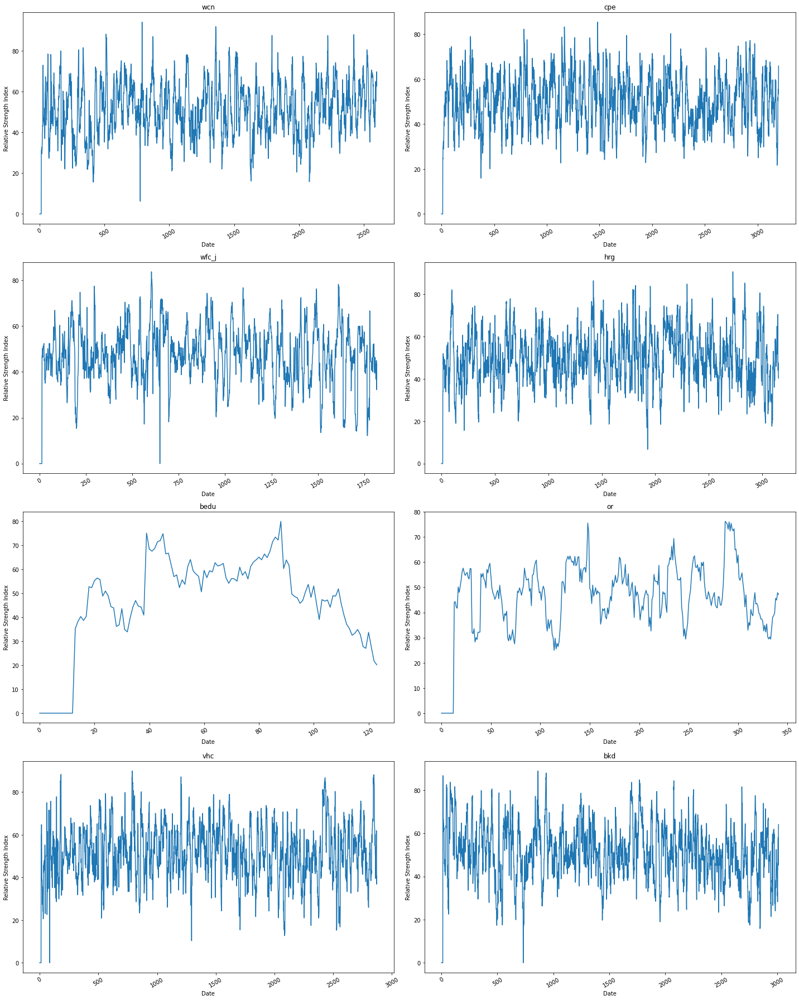

In [20]:
# RSI Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['RSI_14D'])
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Relative Strength Index")
    plt.xticks(rotation=30)
fig.tight_layout()

## Calculation of Volume (Plain)m

In [21]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Volume_plain'] = TechIndicator[stock]['Volume'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain
2596,2017-11-06,69.329,69.558,68.54,68.74,664225,0,wcn,-0.738,63.582469,664225
2597,2017-11-07,68.560,69.230,68.33,69.14,854560,0,wcn,0.400,64.114333,854560
2598,2017-11-08,69.400,69.400,68.44,68.97,692803,0,wcn,-0.170,69.697654,692803
2599,2017-11-09,68.730,69.110,68.46,69.04,585708,0,wcn,0.070,62.608923,585708
2600,2017-11-10,68.950,69.430,68.81,69.29,725001,0,wcn,0.250,63.723211,725001


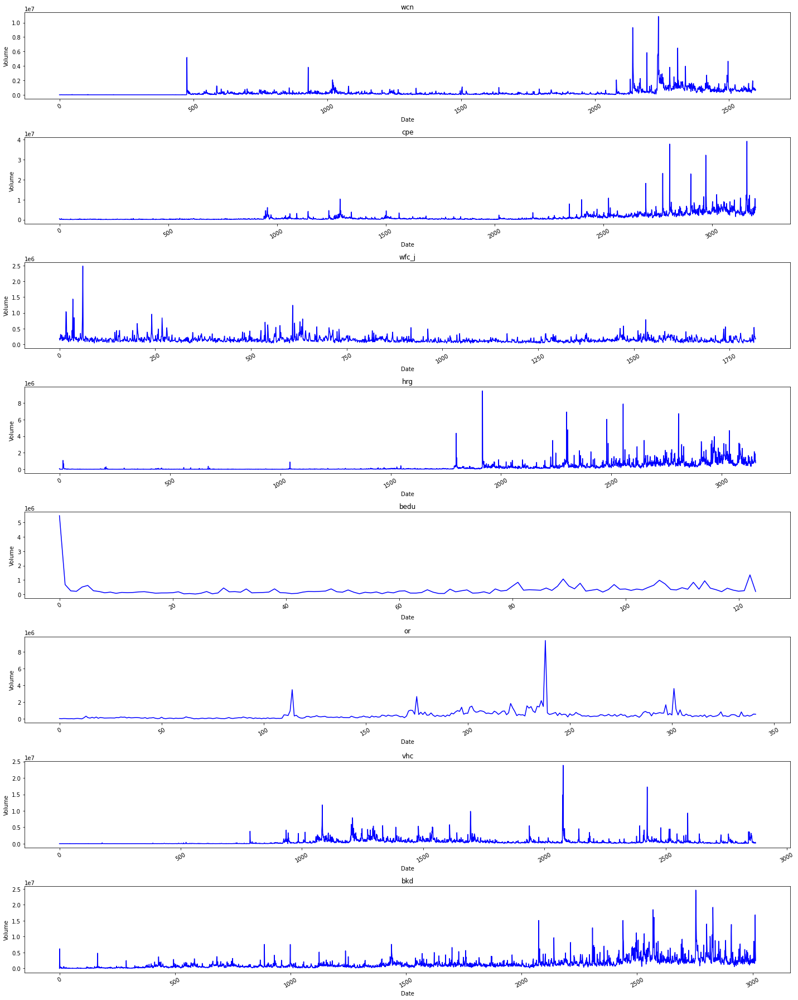

In [22]:
# Volume Plain plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume_plain'], 'b')
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Volume")
    plt.xticks(rotation=30)
fig.tight_layout()

## Calculation of Bollinger Bands

In [23]:
def bbands(price, length=30, numsd=2):
    """ returns average, upper band, and lower band"""
    #ave = pd.stats.moments.rolling_mean(price,length)
    ave = price.rolling(window = length, center = False).mean()
    #sd = pd.stats.moments.rolling_std(price,length)
    sd = price.rolling(window = length, center = False).std()
    upband = ave + (sd*numsd)
    dnband = ave - (sd*numsd)
    return np.round(ave,3), np.round(upband,3), np.round(dnband,3)

In [24]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['BB_Middle_Band'], TechIndicator[stock]['BB_Upper_Band'], TechIndicator[stock]['BB_Lower_Band'] = bbands(TechIndicator[stock]['Close'], length=20, numsd=1)
    TechIndicator[stock]['BB_Middle_Band'] = TechIndicator[stock]['BB_Middle_Band'].fillna(0)
    TechIndicator[stock]['BB_Upper_Band'] = TechIndicator[stock]['BB_Upper_Band'].fillna(0)
    TechIndicator[stock]['BB_Lower_Band'] = TechIndicator[stock]['BB_Lower_Band'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band
2596,2017-11-06,69.329,69.558,68.54,68.74,664225,0,wcn,-0.738,63.582469,664225,70.145,70.941,69.349
2597,2017-11-07,68.560,69.230,68.33,69.14,854560,0,wcn,0.400,64.114333,854560,70.115,70.938,69.292
2598,2017-11-08,69.400,69.400,68.44,68.97,692803,0,wcn,-0.170,69.697654,692803,70.078,70.936,69.219
2599,2017-11-09,68.730,69.110,68.46,69.04,585708,0,wcn,0.070,62.608923,585708,70.028,70.918,69.139
2600,2017-11-10,68.950,69.430,68.81,69.29,725001,0,wcn,0.250,63.723211,725001,70.026,70.917,69.134


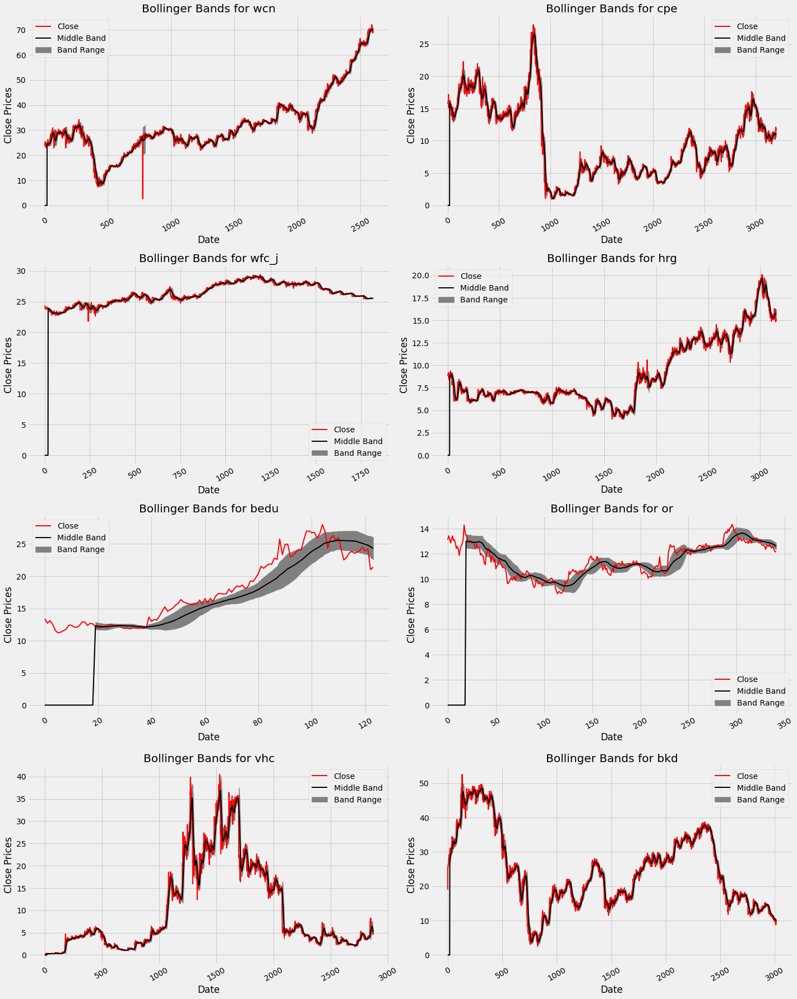

In [25]:
plt.style.use('fivethirtyeight')

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['BB_Upper_Band'], TechIndicator[i]['BB_Lower_Band'], color='grey', label="Band Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label="Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['BB_Middle_Band'], color='black', lw=2, label="Middle Band")
    ax.set_title("Bollinger Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()
#.dt.to_pydatetime()

## Calculation of Aroon Oscillator

In [26]:
def aroon(df, tf=25):
    aroonup = []
    aroondown = []
    x = tf
    while x< len(df['Date']):
        aroon_up = ((df['High'][x-tf:x].tolist().index(max(df['High'][x-tf:x])))/float(tf))*100
        aroon_down = ((df['Low'][x-tf:x].tolist().index(min(df['Low'][x-tf:x])))/float(tf))*100
        aroonup.append(aroon_up)
        aroondown.append(aroon_down)
        x+=1
    return aroonup, aroondown

In [27]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 25
    up, down = aroon(TechIndicator[stock])
    aroon_list = [x - y for x, y in zip(up,down)]
    if len(aroon_list)==0:
        aroon_list = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Aroon_Oscillator'] = aroon_list
    else:
        TechIndicator[stock]['Aroon_Oscillator'] = listofzeros+aroon_list

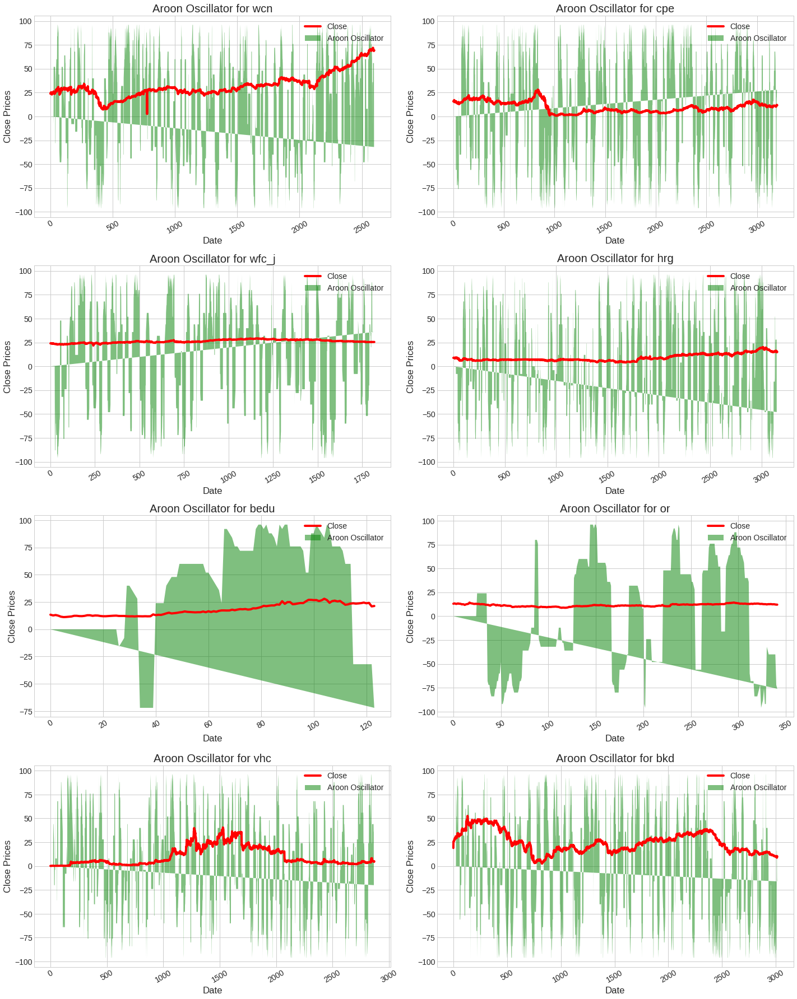

In [28]:
# Aroon Oscillator Plot
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill(TechIndicator[i].index, TechIndicator[i]['Aroon_Oscillator'],'g', alpha = 0.5, label = "Aroon Oscillator")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
    ax.set_title("Aroon Oscillator for " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

## Calculation of Price Volume Trend

PVT = [((CurrentClose - PreviousClose) / PreviousClose) x Volume] + PreviousPVT

In [29]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]["PVT"] = (TechIndicator[stock]['Momentum_1D']/ TechIndicator[stock]['Close'].shift(1))*TechIndicator[stock]['Volume']
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"]-TechIndicator[stock]["PVT"].shift(1)
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT
2596,2017-11-06,69.329,69.558,68.54,68.74,664225,0,wcn,-0.738,63.582469,664225,70.145,70.941,69.349,56.0,-5309.396011
2597,2017-11-07,68.560,69.230,68.33,69.14,854560,0,wcn,0.400,64.114333,854560,70.115,70.938,69.292,56.0,12028.151488
2598,2017-11-08,69.400,69.400,68.44,68.97,692803,0,wcn,-0.170,69.697654,692803,70.078,70.936,69.219,-32.0,-6676.158425
2599,2017-11-09,68.730,69.110,68.46,69.04,585708,0,wcn,0.070,62.608923,585708,70.028,70.918,69.139,-32.0,2297.904648
2600,2017-11-10,68.950,69.430,68.81,69.29,725001,0,wcn,0.250,63.723211,725001,70.026,70.917,69.134,-32.0,2030.838328


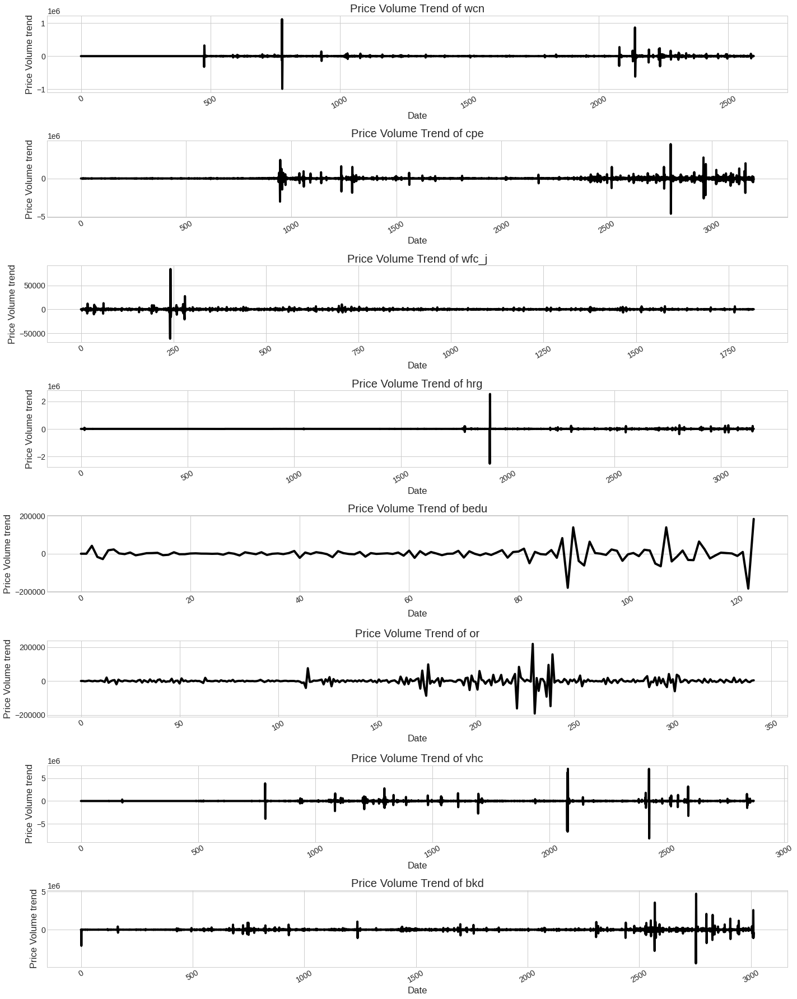

In [30]:
# PRice Volume Trend Plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['PVT'], 'black')
    ax.set_title("Price Volume Trend of " +str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Price Volume trend")
    plt.xticks(rotation=30)
fig.tight_layout()

## Calculation of Acceleration Bands

In [31]:
def abands(df):
    #df['AB_Middle_Band'] = pd.rolling_mean(df['Close'], 20)
    df['AB_Middle_Band'] = df['Close'].rolling(window = 20, center=False).mean()
    # High * ( 1 + 4 * (High - Low) / (High + Low))
    df['aupband'] = df['High'] * (1 + 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Upper_Band'] = df['aupband'].rolling(window=20, center=False).mean()
    # Low *(1 - 4 * (High - Low)/ (High + Low))
    df['adownband'] = df['Low'] * (1 - 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Lower_Band'] = df['adownband'].rolling(window=20, center=False).mean()

In [32]:
for stock in range(len(TechIndicator)):
    abands(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band
2596,2017-11-06,69.329,69.558,68.54,68.74,664225,0,wcn,-0.738,63.582469,664225,70.145,70.941,69.349,56.0,-5309.396011,70.14510,71.609009,72.565082,66.519009,67.972832
2597,2017-11-07,68.560,69.230,68.33,69.14,854560,0,wcn,0.400,64.114333,854560,70.115,70.938,69.292,56.0,12028.151488,70.11520,71.041777,72.552956,66.541777,67.925456
2598,2017-11-08,69.400,69.400,68.44,68.97,692803,0,wcn,-0.170,69.697654,692803,70.078,70.936,69.219,-32.0,-6676.158425,70.07780,71.333372,72.568203,66.533372,67.822953
2599,2017-11-09,68.730,69.110,68.46,69.04,585708,0,wcn,0.070,62.608923,585708,70.028,70.918,69.139,-32.0,2297.904648,70.02845,70.416142,72.483733,67.166142,67.790733
2600,2017-11-10,68.950,69.430,68.81,69.29,725001,0,wcn,0.250,63.723211,725001,70.026,70.917,69.134,-32.0,2030.838328,70.02550,70.675561,72.392059,67.575561,67.808559


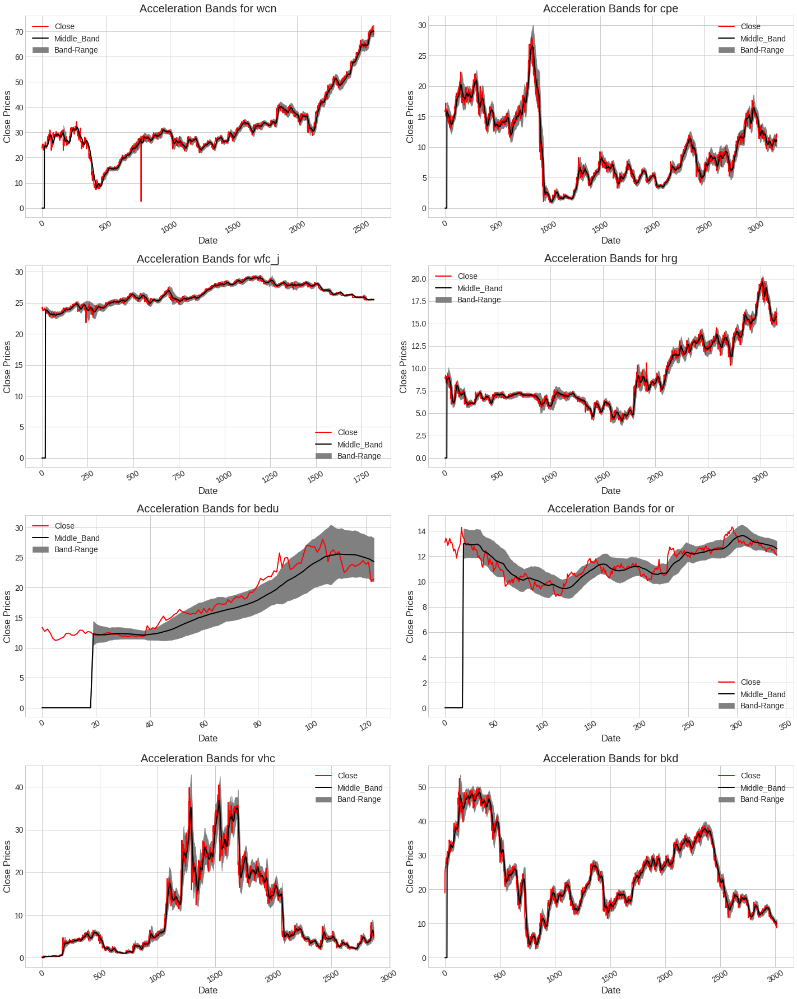

In [33]:
# Acceleration band Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['AB_Upper_Band'], TechIndicator[i]['AB_Lower_Band'], color='grey', label = "Band-Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label = "Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['AB_Middle_Band'], color='black', lw=2, label="Middle_Band")
    ax.set_title("Acceleration Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

## Drop unwanted columns

In [34]:
columns2Drop = ['Momentum_1D', 'aupband', 'adownband']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band
0,2005-03-01,24.031,24.031,24.005,24.031,1162,0,wcn,0.0,1162,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,2005-03-02,23.753,23.753,23.753,23.753,87,0,wcn,0.0,87,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,2005-03-04,24.753,24.753,24.669,24.753,2583,0,wcn,0.0,2583,0.0,0.0,0.0,0.0,109.750609,0.0,0.0,0.0
3,2005-03-07,24.932,24.932,24.932,24.932,335,0,wcn,0.0,335,0.0,0.0,0.0,0.0,-106.321624,0.0,0.0,0.0
4,2005-03-08,25.269,25.269,25.269,25.269,161,0,wcn,0.0,161,0.0,0.0,0.0,0.0,-0.246335,0.0,0.0,0.0


## Calculation of Stochastic Oscillator (%K and %D)

In [35]:
def STOK(df, n):
    df['STOK'] = ((df['Close'] - df['Low'].rolling(window=n, center=False).mean()) / (df['High'].rolling(window=n, center=False).max() - df['Low'].rolling(window=n, center=False).min())) * 100
    df['STOD'] = df['STOK'].rolling(window = 3, center=False).mean()

In [36]:
for stock in range(len(TechIndicator)):
    STOK(TechIndicator[stock], 4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD
2596,2017-11-06,69.329,69.558,68.54,68.74,664225,0,wcn,63.582469,664225,70.145,70.941,69.349,56.0,-5309.396011,70.14510,72.565082,67.972832,-18.951613,-15.286280
2597,2017-11-07,68.560,69.230,68.33,69.14,854560,0,wcn,64.114333,854560,70.115,70.938,69.292,56.0,12028.151488,70.11520,72.552956,67.925456,14.180729,-5.069766
2598,2017-11-08,69.400,69.400,68.44,68.97,692803,0,wcn,69.697654,692803,70.078,70.936,69.219,-32.0,-6676.158425,70.07780,72.568203,67.822953,22.965925,6.065014
2599,2017-11-09,68.730,69.110,68.46,69.04,585708,0,wcn,62.608923,585708,70.028,70.918,69.139,-32.0,2297.904648,70.02845,72.483733,67.790733,48.656352,28.601002
2600,2017-11-10,68.950,69.430,68.81,69.29,725001,0,wcn,63.723211,725001,70.026,70.917,69.134,-32.0,2030.838328,70.02550,72.392059,67.808559,70.909091,47.510456


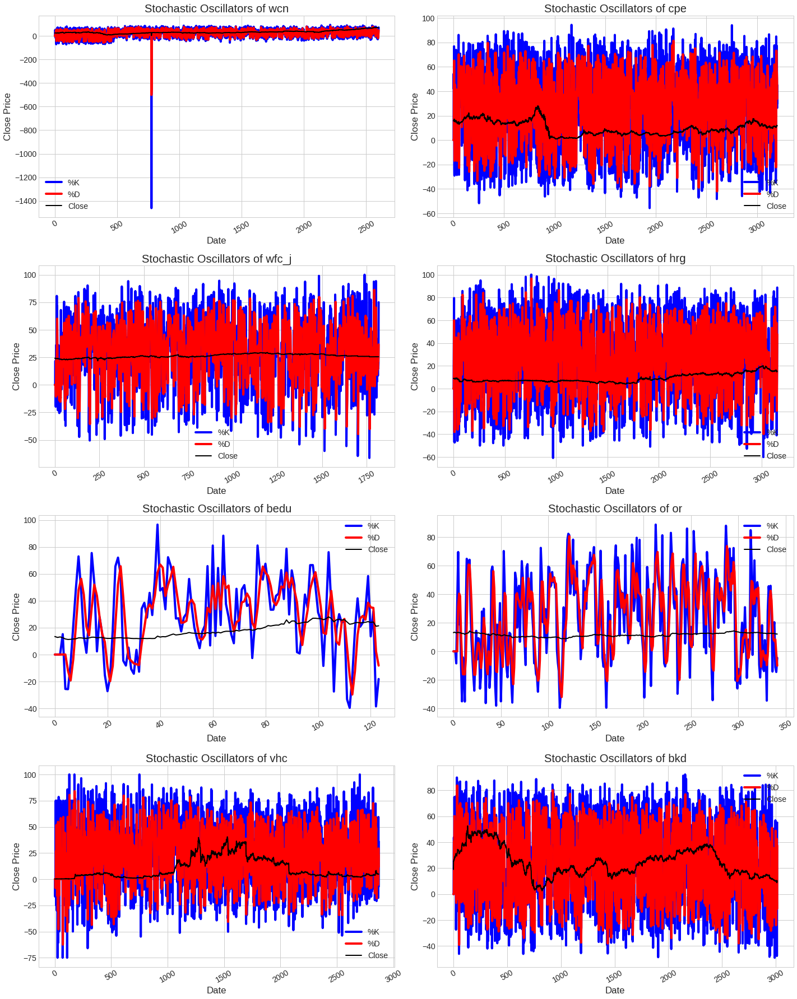

In [37]:
# Stochastic Oscillator plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOK'], 'blue', label="%K")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOD'], 'red', label="%D")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='black', lw=2, label = "Close")
    ax.set_title("Stochastic Oscillators of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

## Calculation of Chaikin Money Flow

In [38]:
def CMFlow(df, tf):
    CHMF = []
    MFMs = []
    MFVs = []
    x = tf
    
    while x < len(df['Date']):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        
        MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
        MFV = MFM*PeriodVolume
        
        MFMs.append(MFM)
        MFVs.append(MFV)
        x+=1
    
    y = tf
    while y < len(MFVs):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        consider = MFVs[y-tf:y]
        tfsMFV = 0
        
        for eachMFV in consider:
            tfsMFV += eachMFV
        
        tfsCMF = tfsMFV/PeriodVolume
        CHMF.append(tfsCMF)
        y+=1
    return CHMF

In [39]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 40
    CHMF = CMFlow(TechIndicator[stock], 20)
    if len(CHMF)==0:
        CHMF = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Chaikin_MF'] = CHMF
    else:
        TechIndicator[stock]['Chaikin_MF'] = listofzeros+CHMF
TechIndicator[0].tail()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in double_scalars
  del sys.path[0]


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF
2596,2017-11-06,69.329,69.558,68.54,68.74,664225,0,wcn,63.582469,664225,70.145,70.941,69.349,56.0,-5309.396011,70.14510,72.565082,67.972832,-18.951613,-15.286280,-3.979049
2597,2017-11-07,68.560,69.230,68.33,69.14,854560,0,wcn,64.114333,854560,70.115,70.938,69.292,56.0,12028.151488,70.11520,72.552956,67.925456,14.180729,-5.069766,-3.915866
2598,2017-11-08,69.400,69.400,68.44,68.97,692803,0,wcn,69.697654,692803,70.078,70.936,69.219,-32.0,-6676.158425,70.07780,72.568203,67.822953,22.965925,6.065014,-4.067172
2599,2017-11-09,68.730,69.110,68.46,69.04,585708,0,wcn,62.608923,585708,70.028,70.918,69.139,-32.0,2297.904648,70.02845,72.483733,67.790733,48.656352,28.601002,-3.620824
2600,2017-11-10,68.950,69.430,68.81,69.29,725001,0,wcn,63.723211,725001,70.026,70.917,69.134,-32.0,2030.838328,70.02550,72.392059,67.808559,70.909091,47.510456,-3.025004


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


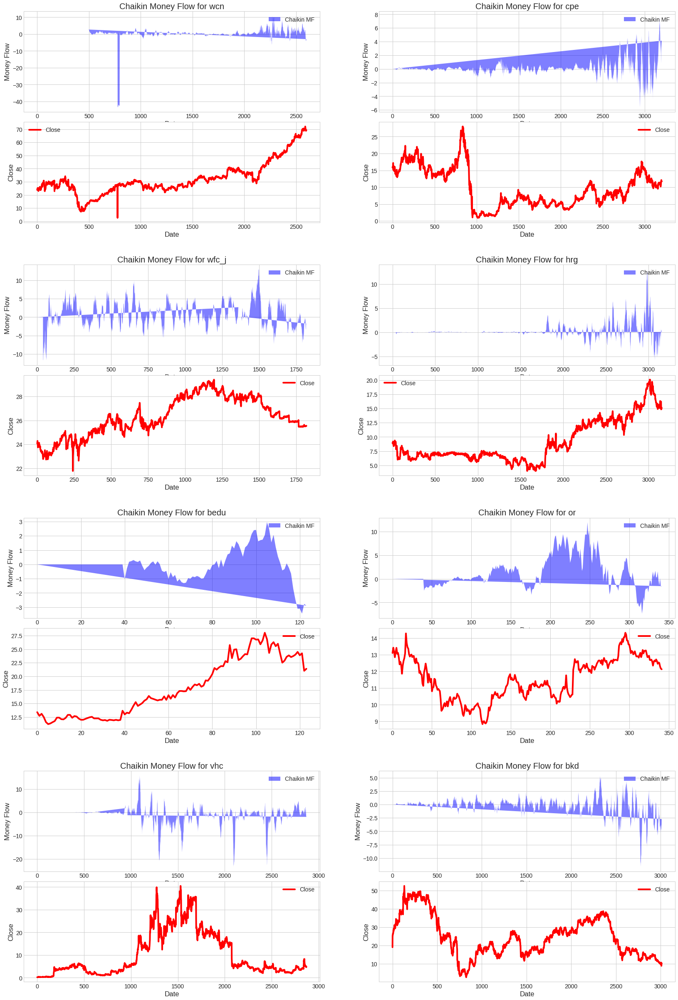

In [40]:
# Chaikin Money Flow Plots
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(25,40))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.1)

    for j in range(2):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.fill(TechIndicator[i].index, TechIndicator[i]['Chaikin_MF'],'b', alpha = 0.5, label = "Chaikin MF")
            ax.set_title("Chaikin Money Flow for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Money Flow")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
            t = ax.set_ylabel("Close")
        ax.legend()
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

## Calculation of Parabolic SAR

In [41]:
def psar(df, iaf = 0.02, maxaf = 0.2):
    length = len(df)
    dates = (df['Date'])
    high = (df['High'])
    low = (df['Low'])
    close = (df['Close'])
    psar = df['Close'][0:len(df['Close'])]
    psarbull = [None] * length
    psarbear = [None] * length
    bull = True
    af = iaf
    ep = df['Low'][0]
    hp = df['High'][0]
    lp = df['Low'][0]
    for i in range(2,length):
        if bull:
            psar[i] = psar[i - 1] + af * (hp - psar[i - 1])
        else:
            psar[i] = psar[i - 1] + af * (lp - psar[i - 1])
        reverse = False
        if bull:
            if df['Low'][i] < psar[i]:
                bull = False
                reverse = True
                psar[i] = hp
                lp = df['Low'][i]
                af = iaf
        else:
            if df['High'][i] > psar[i]:
                bull = True
                reverse = True
                psar[i] = lp
                hp = df['High'][i]
                af = iaf
        if not reverse:
            if bull:
                if df['High'][i] > hp:
                    hp = df['High'][i]
                    af = min(af + iaf, maxaf)
                if df['Low'][i - 1] < psar[i]:
                    psar[i] = df['Low'][i - 1]
                if df['Low'][i - 2] < psar[i]:
                    psar[i] = df['Low'][i - 2]
            else:
                if df['Low'][i] < lp:
                    lp = df['Low'][i]
                    af = min(af + iaf, maxaf)
                if df['High'][i - 1] > psar[i]:
                    psar[i] = df['High'][i - 1]
                if df['High'][i - 2] > psar[i]:
                    psar[i] = df['High'][i - 2]
        if bull:
            psarbull[i] = psar[i]
        else:
            psarbear[i] = psar[i]
    #return {"dates":dates, "high":high, "low":low, "close":close, "psar":psar, "psarbear":psarbear, "psarbull":psarbull}
    #return psar, psarbear, psarbull
    df['psar'] = psar
    #df['psarbear'] = psarbear
    #df['psarbull'] = psarbull

In [42]:
for stock in range(len(TechIndicator)):
    psar(TechIndicator[stock])

TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar
2596,2017-11-06,69.329,69.558,68.54,73.505106,664225,0,wcn,63.582469,664225,70.145,70.941,69.349,56.0,-5309.396011,70.14510,72.565082,67.972832,-18.951613,-15.286280,-3.979049,73.505106
2597,2017-11-07,68.560,69.230,68.33,73.107898,854560,0,wcn,64.114333,854560,70.115,70.938,69.292,56.0,12028.151488,70.11520,72.552956,67.925456,14.180729,-5.069766,-3.915866,73.107898
2598,2017-11-08,69.400,69.400,68.44,72.630108,692803,0,wcn,69.697654,692803,70.078,70.936,69.219,-32.0,-6676.158425,70.07780,72.568203,67.822953,22.965925,6.065014,-4.067172,72.630108
2599,2017-11-09,68.730,69.110,68.46,72.200097,585708,0,wcn,62.608923,585708,70.028,70.918,69.139,-32.0,2297.904648,70.02845,72.483733,67.790733,48.656352,28.601002,-3.620824,72.200097
2600,2017-11-10,68.950,69.430,68.81,71.813088,725001,0,wcn,63.723211,725001,70.026,70.917,69.134,-32.0,2030.838328,70.02550,72.392059,67.808559,70.909091,47.510456,-3.025004,71.813088


## Calculation of Price Rate of Change

In [43]:
# ROC = [(Close - Close n periods ago) / (Close n periods ago)] * 100
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['ROC'] = ((TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(12))/(TechIndicator[stock]['Close'].shift(12)))*100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC
2596,2017-11-06,69.329,69.558,68.54,73.505106,664225,0,wcn,63.582469,664225,70.145,70.941,69.349,56.0,-5309.396011,70.14510,72.565082,67.972832,-18.951613,-15.286280,-3.979049,73.505106,7.102823
2597,2017-11-07,68.560,69.230,68.33,73.107898,854560,0,wcn,64.114333,854560,70.115,70.938,69.292,56.0,12028.151488,70.11520,72.552956,67.925456,14.180729,-5.069766,-3.915866,73.107898,6.313485
2598,2017-11-08,69.400,69.400,68.44,72.630108,692803,0,wcn,69.697654,692803,70.078,70.936,69.219,-32.0,-6676.158425,70.07780,72.568203,67.822953,22.965925,6.065014,-4.067172,72.630108,5.422790
2599,2017-11-09,68.730,69.110,68.46,72.200097,585708,0,wcn,62.608923,585708,70.028,70.918,69.139,-32.0,2297.904648,70.02845,72.483733,67.790733,48.656352,28.601002,-3.620824,72.200097,4.616236
2600,2017-11-10,68.950,69.430,68.81,71.813088,725001,0,wcn,63.723211,725001,70.026,70.917,69.134,-32.0,2030.838328,70.02550,72.392059,67.808559,70.909091,47.510456,-3.025004,71.813088,3.885514


## Calculation of Volume Weighted Average Price

In [44]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['VWAP'] = np.cumsum(TechIndicator[stock]['Volume'] * (TechIndicator[stock]['High'] + TechIndicator[stock]['Low'])/2) / np.cumsum(TechIndicator[stock]['Volume'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP
2596,2017-11-06,69.329,69.558,68.54,73.505106,664225,0,wcn,63.582469,664225,70.145,70.941,69.349,56.0,-5309.396011,70.14510,72.565082,67.972832,-18.951613,-15.286280,-3.979049,73.505106,7.102823,41.979409
2597,2017-11-07,68.560,69.230,68.33,73.107898,854560,0,wcn,64.114333,854560,70.115,70.938,69.292,56.0,12028.151488,70.11520,72.552956,67.925456,14.180729,-5.069766,-3.915866,73.107898,6.313485,42.008119
2598,2017-11-08,69.400,69.400,68.44,72.630108,692803,0,wcn,69.697654,692803,70.078,70.936,69.219,-32.0,-6676.158425,70.07780,72.568203,67.822953,22.965925,6.065014,-4.067172,72.630108,5.422790,42.031471
2599,2017-11-09,68.730,69.110,68.46,72.200097,585708,0,wcn,62.608923,585708,70.028,70.918,69.139,-32.0,2297.904648,70.02845,72.483733,67.790733,48.656352,28.601002,-3.620824,72.200097,4.616236,42.051083
2600,2017-11-10,68.950,69.430,68.81,71.813088,725001,0,wcn,63.723211,725001,70.026,70.917,69.134,-32.0,2030.838328,70.02550,72.392059,67.808559,70.909091,47.510456,-3.025004,71.813088,3.885514,42.075623


## Calculation of Momentum

In [45]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum'] = TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum
2596,2017-11-06,69.329,69.558,68.54,73.505106,664225,0,wcn,63.582469,664225,70.145,70.941,69.349,56.0,-5309.396011,70.14510,72.565082,67.972832,-18.951613,-15.286280,-3.979049,73.505106,7.102823,41.979409,3.341082
2597,2017-11-07,68.560,69.230,68.33,73.107898,854560,0,wcn,64.114333,854560,70.115,70.938,69.292,56.0,12028.151488,70.11520,72.552956,67.925456,14.180729,-5.069766,-3.915866,73.107898,6.313485,42.008119,-0.941102
2598,2017-11-08,69.400,69.400,68.44,72.630108,692803,0,wcn,69.697654,692803,70.078,70.936,69.219,-32.0,-6676.158425,70.07780,72.568203,67.822953,22.965925,6.065014,-4.067172,72.630108,5.422790,42.031471,-1.329072
2599,2017-11-09,68.730,69.110,68.46,72.200097,585708,0,wcn,62.608923,585708,70.028,70.918,69.139,-32.0,2297.904648,70.02845,72.483733,67.790733,48.656352,28.601002,-3.620824,72.200097,4.616236,42.051083,-1.576675
2600,2017-11-10,68.950,69.430,68.81,71.813088,725001,0,wcn,63.723211,725001,70.026,70.917,69.134,-32.0,2030.838328,70.02550,72.392059,67.808559,70.909091,47.510456,-3.025004,71.813088,3.885514,42.075623,-1.692019


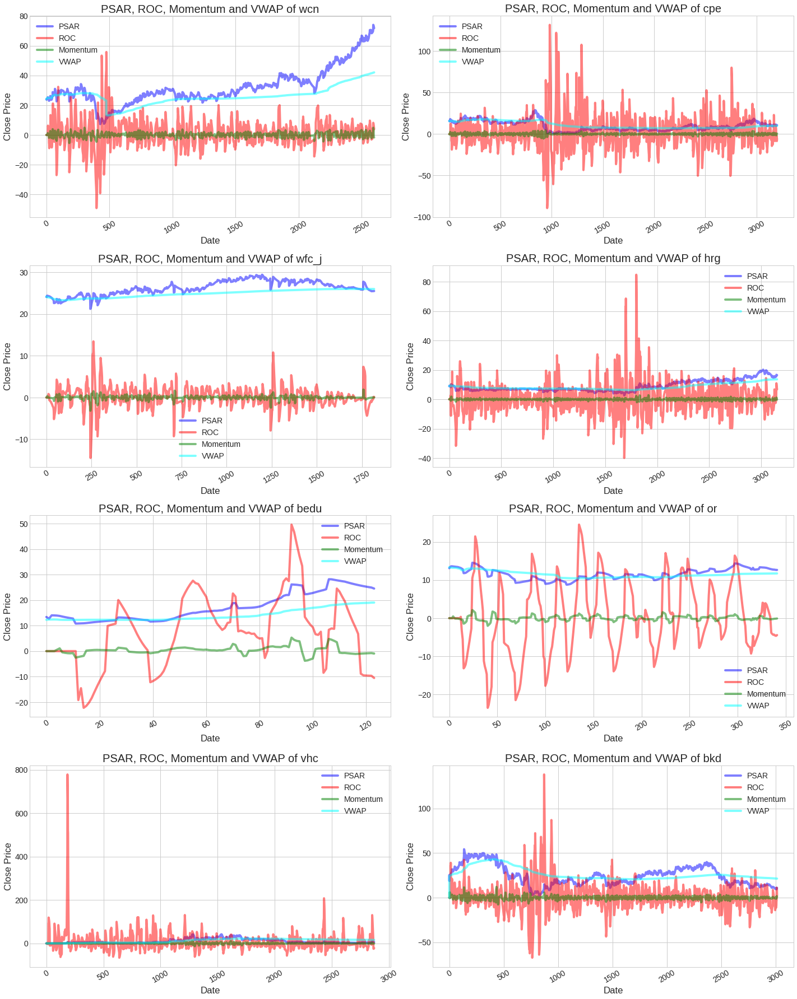

In [46]:
# Parabolic SAR, Rate of Change, Momentum and VWAP Plots
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['psar'], 'blue', label="PSAR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ROC'], 'red', label="ROC", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Momentum'], 'green', label="Momentum", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['VWAP'], 'cyan', label="VWAP", alpha = 0.5)
    ax.set_title("PSAR, ROC, Momentum and VWAP of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

## Calculation of Triple Exponential Moving Average
Triple Exponential MA Formula:

T-EMA = (3EMA – 3EMA(EMA)) + EMA(EMA(EMA))

Where:

EMA = EMA(1) + α * (Close – EMA(1))

α = 2 / (N + 1)

N = The smoothing period.

In [47]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['EMA'] = TechIndicator[stock]['Close'].ewm(span=3,min_periods=0,adjust=True,ignore_na=False).mean()
    
    TechIndicator[stock] = TechIndicator[stock].fillna(0)

for stock in range(len(TechIndicator)):
    TechIndicator[stock]['TEMA'] = (3 * TechIndicator[stock]['EMA'] - 3 * TechIndicator[stock]['EMA'] * TechIndicator[stock]['EMA']) + (TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA'])
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,EMA,TEMA
337,2017-11-06,12.43,12.65,12.360,12.7400,435741,0,or,39.743590,435741,12.789,13.059,12.519,-40.0,7356.185127,12.7890,13.356392,12.250592,15.476190,8.783730,-0.310814,12.7400,-4.359579,11.720907,-0.227997,12.791702,1640.568070
338,2017-11-07,12.57,12.57,12.410,12.7300,339480,0,or,45.607477,339480,12.760,13.027,12.493,-40.0,-3609.848134,12.7600,13.312294,12.223994,20.394737,7.248642,-1.408032,12.7300,-4.332678,11.722622,-0.169697,12.760851,1627.732812
339,2017-11-08,12.65,12.65,12.230,12.6855,422473,0,or,44.958372,422473,12.713,12.975,12.451,-40.0,-6617.428025,12.7130,13.298246,12.169946,-11.000000,8.290309,0.131597,12.6855,-4.567307,11.724608,-0.152727,12.723175,1612.149316
340,2017-11-09,12.25,12.26,12.035,12.6500,586315,0,or,47.834646,586315,12.659,12.916,12.402,-72.0,1704.780484,12.6590,13.252869,12.105819,-14.430894,-1.678719,-1.627811,12.6500,-4.635614,11.726226,-0.132904,12.686588,1597.111287
341,2017-11-10,12.18,12.21,11.970,12.6500,565649,0,or,47.138700,565649,12.603,12.844,12.361,-76.0,3865.642064,12.6025,13.204011,12.036961,-4.595588,-10.008828,-1.532186,12.6500,-4.444022,11.727564,-0.090000,12.668294,1589.627491


## Calculation of Commodity Channel Index

In [48]:
def CCI(df, n, constant):
    TP = (df['High'] + df['Low'] + df['Close']) / 3
    CCI = pd.Series((TP - TP.rolling(window=n, center=False).mean()) / (constant * TP.rolling(window=n, center=False).std())) #, name = 'CCI_' + str(n))
    return CCI

In [49]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['CCI'] = CCI(TechIndicator[stock], 20, 0.015)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,EMA,TEMA,CCI
2596,2017-11-06,69.329,69.558,68.54,73.505106,664225,0,wcn,63.582469,664225,70.145,70.941,69.349,56.0,-5309.396011,70.14510,72.565082,67.972832,-18.951613,-15.286280,-3.979049,73.505106,7.102823,41.979409,3.341082,73.436045,380071.520859,30.365951
2597,2017-11-07,68.560,69.230,68.33,73.107898,854560,0,wcn,64.114333,854560,70.115,70.938,69.292,56.0,12028.151488,70.11520,72.552956,67.925456,14.180729,-5.069766,-3.915866,73.107898,6.313485,42.008119,-0.941102,73.271971,377494.695891,0.471378
2598,2017-11-08,69.400,69.400,68.44,72.630108,692803,0,wcn,69.697654,692803,70.078,70.936,69.219,-32.0,-6676.158425,70.07780,72.568203,67.822953,22.965925,6.065014,-4.067172,72.630108,5.422790,42.031471,-1.329072,72.951040,372488.087740,-6.275028
2599,2017-11-09,68.730,69.110,68.46,72.200097,585708,0,wcn,62.608923,585708,70.028,70.918,69.139,-32.0,2297.904648,70.02845,72.483733,67.790733,48.656352,28.601002,-3.620824,72.200097,4.616236,42.051083,-1.576675,72.575569,366687.075978,-30.318450
2600,2017-11-10,68.950,69.430,68.81,71.813088,725001,0,wcn,63.723211,725001,70.026,70.917,69.134,-32.0,2030.838328,70.02550,72.392059,67.808559,70.909091,47.510456,-3.025004,71.813088,3.885514,42.075623,-1.692019,72.194328,360858.874116,-25.529195


## Calculation of On Balance Volume
If the closing price is above the prior close price then: Current OBV = Previous OBV + Current Volume

If the closing price is below the prior close price then: Current OBV = Previous OBV - Current Volume

If the closing prices equals the prior close price then: Current OBV = Previous OBV (no change)

In [50]:
for stock in range(len(TechIndicator)):
    new = (TechIndicator[stock]['Volume'] * (~TechIndicator[stock]['Close'].diff().le(0) * 2 -1)).cumsum()
    TechIndicator[stock]['OBV'] = new
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,EMA,TEMA,CCI,OBV
337,2017-11-06,12.43,12.65,12.360,12.7400,435741,0,or,39.743590,435741,12.789,13.059,12.519,-40.0,7356.185127,12.7890,13.356392,12.250592,15.476190,8.783730,-0.310814,12.7400,-4.359579,11.720907,-0.227997,12.791702,1640.568070,-117.364068,9022873
338,2017-11-07,12.57,12.57,12.410,12.7300,339480,0,or,45.607477,339480,12.760,13.027,12.493,-40.0,-3609.848134,12.7600,13.312294,12.223994,20.394737,7.248642,-1.408032,12.7300,-4.332678,11.722622,-0.169697,12.760851,1627.732812,-107.721173,8683393
339,2017-11-08,12.65,12.65,12.230,12.6855,422473,0,or,44.958372,422473,12.713,12.975,12.451,-40.0,-6617.428025,12.7130,13.298246,12.169946,-11.000000,8.290309,0.131597,12.6855,-4.567307,11.724608,-0.152727,12.723175,1612.149316,-109.993864,8260920
340,2017-11-09,12.25,12.26,12.035,12.6500,586315,0,or,47.834646,586315,12.659,12.916,12.402,-72.0,1704.780484,12.6590,13.252869,12.105819,-14.430894,-1.678719,-1.627811,12.6500,-4.635614,11.726226,-0.132904,12.686588,1597.111287,-152.074693,7674605
341,2017-11-10,12.18,12.21,11.970,12.6500,565649,0,or,47.138700,565649,12.603,12.844,12.361,-76.0,3865.642064,12.6025,13.204011,12.036961,-4.595588,-10.008828,-1.532186,12.6500,-4.444022,11.727564,-0.090000,12.668294,1589.627491,-140.916614,7108956


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


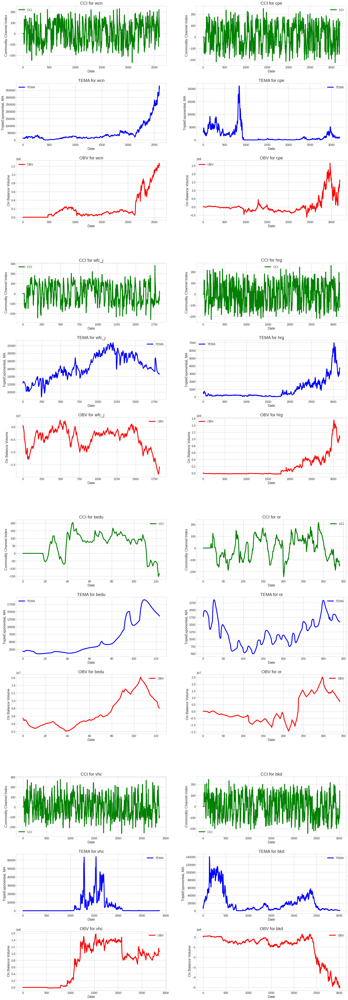

In [51]:
# Commodity Channel Index, Triple Exponential Moving Average On Banalance Volume Plots

fig = plt.figure(figsize=(25,80))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.3, hspace=0.3)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['CCI'], 'green', label="CCI")
            t = ax.set_title("CCI for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Commodity Channel Index")
        elif j == 1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['TEMA'], 'blue', label="TEMA")
            t = ax.set_title("TEMA for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("TripleExponentiaL MA")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['OBV'], 'red', label="OBV")
            t = ax.set_title("OBV for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("On Balance Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

## Calcualtion of Keltner Channels

In [52]:
#Keltner Channel  
def KELCH(df, n):  
    KelChM = pd.Series(((df['High'] + df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChM_' + str(n))  
    KelChU = pd.Series(((4 * df['High'] - 2 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChU_' + str(n))  
    KelChD = pd.Series(((-2 * df['High'] + 4 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChD_' + str(n))    
    return KelChM, KelChD, KelChU

In [53]:
for stock in range(len(TechIndicator)):
    KelchM, KelchD, KelchU = KELCH(TechIndicator[stock], 14)
    TechIndicator[stock]['Kelch_Upper'] = KelchU
    TechIndicator[stock]['Kelch_Middle'] = KelchM
    TechIndicator[stock]['Kelch_Down'] = KelchD
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,EMA,TEMA,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down
337,2017-11-06,12.43,12.65,12.360,12.7400,435741,0,or,39.743590,435741,12.789,13.059,12.519,-40.0,7356.185127,12.7890,13.356392,12.250592,15.476190,8.783730,-0.310814,12.7400,-4.359579,11.720907,-0.227997,12.791702,1640.568070,-117.364068,9022873,13.019401,12.804472,12.589544
338,2017-11-07,12.57,12.57,12.410,12.7300,339480,0,or,45.607477,339480,12.760,13.027,12.493,-40.0,-3609.848134,12.7600,13.312294,12.223994,20.394737,7.248642,-1.408032,12.7300,-4.332678,11.722622,-0.169697,12.760851,1627.732812,-107.721173,8683393,12.987848,12.771491,12.555134
339,2017-11-08,12.65,12.65,12.230,12.6855,422473,0,or,44.958372,422473,12.713,12.975,12.451,-40.0,-6617.428025,12.7130,13.298246,12.169946,-11.000000,8.290309,0.131597,12.6855,-4.567307,11.724608,-0.152727,12.723175,1612.149316,-109.993864,8260920,12.970819,12.733748,12.496676
340,2017-11-09,12.25,12.26,12.035,12.6500,586315,0,or,47.834646,586315,12.659,12.916,12.402,-72.0,1704.780484,12.6590,13.252869,12.105819,-14.430894,-1.678719,-1.627811,12.6500,-4.635614,11.726226,-0.132904,12.686588,1597.111287,-152.074693,7674605,12.926378,12.688235,12.450092
341,2017-11-10,12.18,12.21,11.970,12.6500,565649,0,or,47.138700,565649,12.603,12.844,12.361,-76.0,3865.642064,12.6025,13.204011,12.036961,-4.595588,-10.008828,-1.532186,12.6500,-4.444022,11.727564,-0.090000,12.668294,1589.627491,-140.916614,7108956,12.882030,12.643173,12.404316


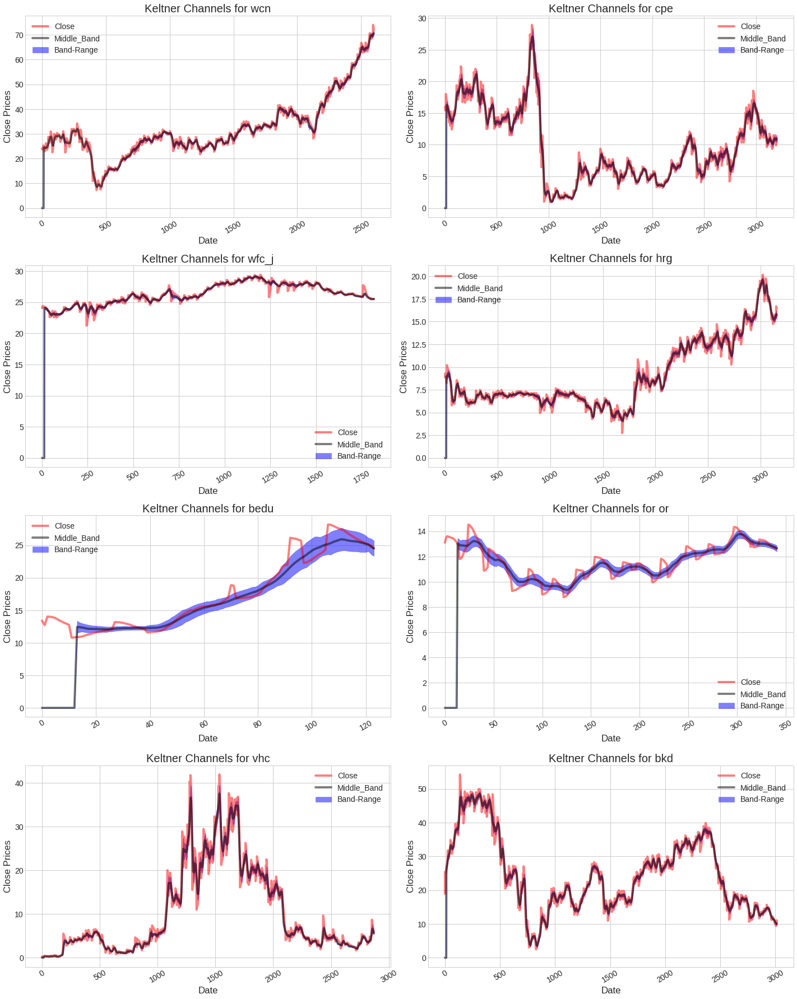

In [54]:
# Keltner Channels Plots

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['Kelch_Upper'], TechIndicator[i]['Kelch_Down'], 
                    color='blue', label = "Band-Range", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', label = "Close", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Kelch_Middle'], color='black', label="Middle_Band", alpha = 0.5)
    ax.set_title("Keltner Channels for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

## Calculation of Normalized Average True Range
True Range = Highest of (HIgh - low, abs(High - previous close), abs(low - previous close))

Average True Range = 14 day MA of True Range

Normalized Average True Range = ATR / Close * 100

In [55]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['HL'] = TechIndicator[stock]['High'] - TechIndicator[stock]['Low']
    TechIndicator[stock]['absHC'] = abs(TechIndicator[stock]['High'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['absLC'] = abs(TechIndicator[stock]['Low'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['TR'] = TechIndicator[stock][['HL','absHC','absLC']].max(axis=1)
    TechIndicator[stock]['ATR'] = TechIndicator[stock]['TR'].rolling(window=14).mean()
    TechIndicator[stock]['NATR'] = (TechIndicator[stock]['ATR'] / TechIndicator[stock]['Close']) *100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,EMA,TEMA,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,HL,absHC,absLC,TR,ATR,NATR
337,2017-11-06,12.43,12.65,12.360,12.7400,435741,0,or,39.743590,435741,12.789,13.059,12.519,-40.0,7356.185127,12.7890,13.356392,12.250592,15.476190,8.783730,-0.310814,12.7400,-4.359579,11.720907,-0.227997,12.791702,1640.568070,-117.364068,9022873,13.019401,12.804472,12.589544,0.290,0.132904,0.422904,0.422904,0.589703,4.628752
338,2017-11-07,12.57,12.57,12.410,12.7300,339480,0,or,45.607477,339480,12.760,13.027,12.493,-40.0,-3609.848134,12.7600,13.312294,12.223994,20.394737,7.248642,-1.408032,12.7300,-4.332678,11.722622,-0.169697,12.760851,1627.732812,-107.721173,8683393,12.987848,12.771491,12.555134,0.160,0.170000,0.330000,0.330000,0.574703,4.514556
339,2017-11-08,12.65,12.65,12.230,12.6855,422473,0,or,44.958372,422473,12.713,12.975,12.451,-40.0,-6617.428025,12.7130,13.298246,12.169946,-11.000000,8.290309,0.131597,12.6855,-4.567307,11.724608,-0.152727,12.723175,1612.149316,-109.993864,8260920,12.970819,12.733748,12.496676,0.420,0.080000,0.500000,0.500000,0.575759,4.538717
340,2017-11-09,12.25,12.26,12.035,12.6500,586315,0,or,47.834646,586315,12.659,12.916,12.402,-72.0,1704.780484,12.6590,13.252869,12.105819,-14.430894,-1.678719,-1.627811,12.6500,-4.635614,11.726226,-0.132904,12.686588,1597.111287,-152.074693,7674605,12.926378,12.688235,12.450092,0.225,0.425500,0.650500,0.650500,0.575743,4.551326
341,2017-11-10,12.18,12.21,11.970,12.6500,565649,0,or,47.138700,565649,12.603,12.844,12.361,-76.0,3865.642064,12.6025,13.204011,12.036961,-4.595588,-10.008828,-1.532186,12.6500,-4.444022,11.727564,-0.090000,12.668294,1589.627491,-140.916614,7108956,12.882030,12.643173,12.404316,0.240,0.440000,0.680000,0.680000,0.573848,4.536346


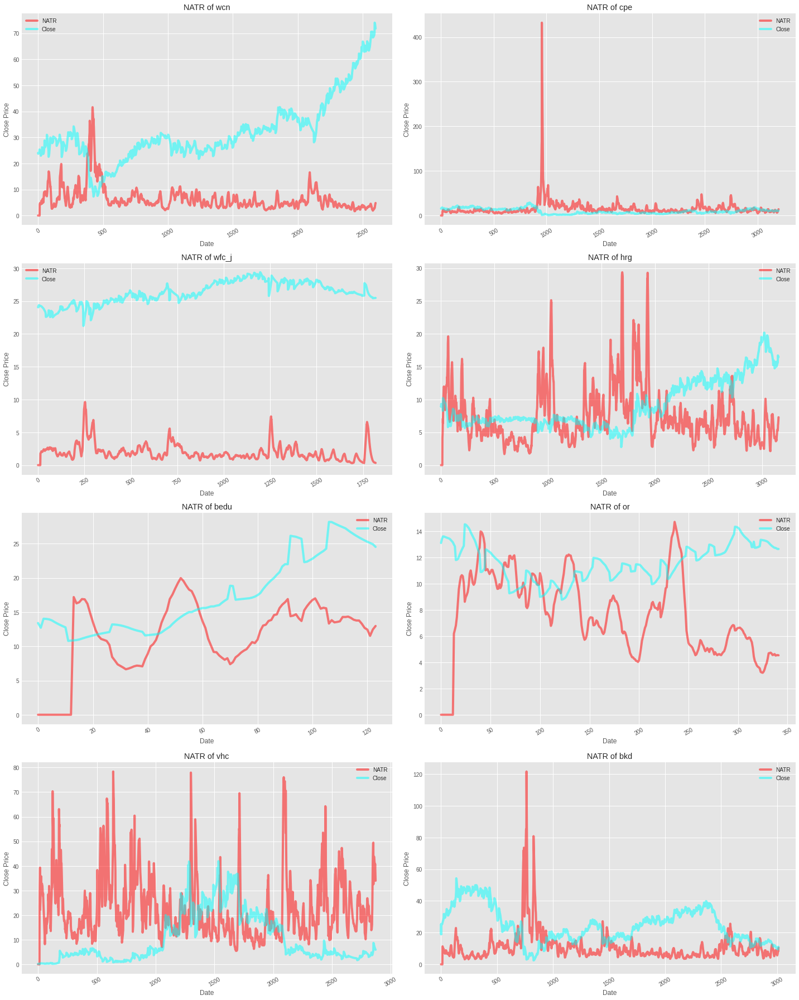

In [56]:
# Normalized Average True range Plots
plt.style.use('ggplot')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['NATR'], 'red', label="NATR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'cyan', label="Close", alpha = 0.5)
    ax.set_title("NATR of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

## Calculation of Average Directional Movement Index (ADX)
Calculating the DMI can actually be broken down into two parts. First, calculating the +DI and -DI, and second, calculating the ADX.

To calculate the +DI and -DI you need to find the +DM and -DM (Directional Movement). +DM and -DM are calculated using the High, Low and Close for each period. You can then calculate the following:

Current High - Previous High = UpMove Previous Low - Current Low = DownMove

If UpMove > DownMove and UpMove > 0, then +DM = UpMove, else +DM = 0 If DownMove > Upmove and Downmove > 0, then -DM = DownMove, else -DM = 0

Once you have the current +DM and -DM calculated, the +DM and -DM lines can be calculated and plotted based on the number of user defined periods.

+DI = 100 times Exponential Moving Average of (+DM / Average True Range) -DI = 100 times Exponential Moving Average of (-DM / Average True Range)

Now that -+DX and -DX have been calculated, the last step is calculating the ADX.

ADX = 100 times the Exponential Moving Average of the Absolute Value of (+DI - -DI) / (+DI + -DI)

In [57]:
def DMI(df, period):
    df['UpMove'] = df['High'] - df['High'].shift(1)
    df['DownMove'] = df['Low'].shift(1) - df['Low']
    df['Zero'] = 0

    df['PlusDM'] = np.where((df['UpMove'] > df['DownMove']) & (df['UpMove'] > df['Zero']), df['UpMove'], 0)
    df['MinusDM'] = np.where((df['UpMove'] < df['DownMove']) & (df['DownMove'] > df['Zero']), df['DownMove'], 0)

    df['plusDI'] = 100 * (df['PlusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()
    df['minusDI'] = 100 * (df['MinusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

    df['ADX'] = 100 * (abs((df['plusDI'] - df['minusDI'])/(df['plusDI'] + df['minusDI']))).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

In [58]:
for stock in range(len(TechIndicator)):
    DMI(TechIndicator[stock], 14)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,EMA,TEMA,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,HL,absHC,absLC,TR,ATR,NATR,UpMove,DownMove,Zero,PlusDM,MinusDM,plusDI,minusDI,ADX
337,2017-11-06,12.43,12.65,12.360,12.7400,435741,0,or,39.743590,435741,12.789,13.059,12.519,-40.0,7356.185127,12.7890,13.356392,12.250592,15.476190,8.783730,-0.310814,12.7400,-4.359579,11.720907,-0.227997,12.791702,1640.568070,-117.364068,9022873,13.019401,12.804472,12.589544,0.290,0.132904,0.422904,0.422904,0.589703,4.628752,-0.08,0.020,0,0.0,0.020,4.735917,12.053869,41.567970
338,2017-11-07,12.57,12.57,12.410,12.7300,339480,0,or,45.607477,339480,12.760,13.027,12.493,-40.0,-3609.848134,12.7600,13.312294,12.223994,20.394737,7.248642,-1.408032,12.7300,-4.332678,11.722622,-0.169697,12.760851,1627.732812,-107.721173,8683393,12.987848,12.771491,12.555134,0.160,0.170000,0.330000,0.330000,0.574703,4.514556,-0.08,-0.050,0,0.0,0.000,4.104461,10.446686,41.837006
339,2017-11-08,12.65,12.65,12.230,12.6855,422473,0,or,44.958372,422473,12.713,12.975,12.451,-40.0,-6617.428025,12.7130,13.298246,12.169946,-11.000000,8.290309,0.131597,12.6855,-4.567307,11.724608,-0.152727,12.723175,1612.149316,-109.993864,8260920,12.970819,12.733748,12.496676,0.420,0.080000,0.500000,0.500000,0.575759,4.538717,0.08,0.180,0,0.0,0.180,3.557200,13.222206,43.938793
340,2017-11-09,12.25,12.26,12.035,12.6500,586315,0,or,47.834646,586315,12.659,12.916,12.402,-72.0,1704.780484,12.6590,13.252869,12.105819,-14.430894,-1.678719,-1.627811,12.6500,-4.635614,11.726226,-0.132904,12.686588,1597.111287,-152.074693,7674605,12.926378,12.688235,12.450092,0.225,0.425500,0.650500,0.650500,0.575743,4.551326,-0.39,0.195,0,0.0,0.195,3.082906,15.975151,47.099915
341,2017-11-10,12.18,12.21,11.970,12.6500,565649,0,or,47.138700,565649,12.603,12.844,12.361,-76.0,3865.642064,12.6025,13.204011,12.036961,-4.595588,-10.008828,-1.532186,12.6500,-4.444022,11.727564,-0.090000,12.668294,1589.627491,-140.916614,7108956,12.882030,12.643173,12.404316,0.240,0.440000,0.680000,0.680000,0.573848,4.536346,-0.05,0.065,0,0.0,0.065,2.671852,15.355404,50.200945


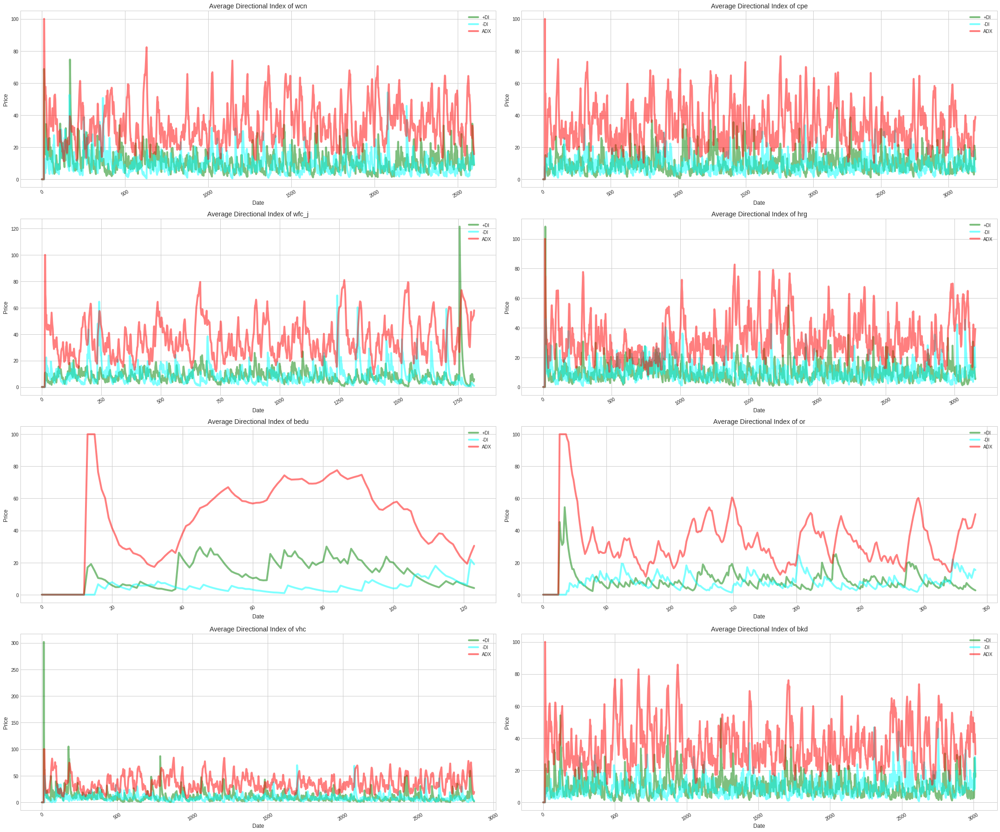

In [59]:
# Average Directional Index

plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(30,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['plusDI'], 'green', label="+DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['minusDI'], 'cyan', label="-DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ADX'], 'red', label="ADX", alpha = 0.5)
    ax.set_title("Average Directional Index of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

## Drop Unwanted Columns

In [60]:
columns2Drop = ['UpMove', 'DownMove', 'ATR', 'PlusDM', 'MinusDM', 'Zero', 'EMA', 'HL', 'absHC', 'absLC', 'TR']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,TEMA,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,NATR,plusDI,minusDI,ADX
0,2010-08-23,24.142,24.209,24.081,24.081,190437,0,wfc_j,0.0,190437,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,24.081,0.0,24.145000,0.000,12297.000240,0.0,190437,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2010-08-24,24.116,24.175,24.047,24.149,137529,0,wfc_j,0.0,137529,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,24.149,0.0,24.130742,0.000,12369.594264,0.0,327966,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2010-08-25,24.149,24.312,24.098,24.209,156536,0,wfc_j,0.0,156536,0.0,0.0,0.0,0.0,506.173667,0.0,0.0,0.0,0.000000,0.0,0.0,24.209,0.0,24.154734,0.000,12445.541852,0.0,484502,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2010-08-26,24.287,24.380,24.081,24.098,318588,0,wfc_j,0.0,318588,0.0,0.0,0.0,0.0,-2704.762092,0.0,0.0,0.0,21.696697,0.0,0.0,24.098,0.0,24.184791,0.000,12380.722007,0.0,165914,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2010-08-27,23.661,23.953,23.661,24.380,181739,0,wfc_j,0.0,181739,0.0,0.0,0.0,0.0,-372.229833,0.0,0.0,0.0,-15.681502,0.0,0.0,24.380,0.0,24.115074,0.299,12586.296795,0.0,347653,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Calculation of Money Flow Index
Typical Price = (High + Low + Close)/3

Raw Money Flow = Typical Price x Volume

The money flow is divided into positive and negative money flow.

- Positive money flow is calculated by adding the money flow of all the days where the typical price is higher than the previous day's typical price.
- Negative money flow is calculated by adding the money flow of all the days where the typical price is lower than the previous day's typical price.
- If typical price is unchanged then that day is discarded.
Money Flow Ratio = (14-period Positive Money Flow)/(14-period Negative Money Flow)

Money Flow Index = 100 - 100/(1 + Money Flow Ratio)

In [61]:
def MFI(df):
    # typical price
    df['tp'] = (df['High']+df['Low']+df['Close'])/3
    #raw money flow
    df['rmf'] = df['tp'] * df['Volume']
    
    # positive and negative money flow
    df['pmf'] = np.where(df['tp'] > df['tp'].shift(1), df['tp'], 0)
    df['nmf'] = np.where(df['tp'] < df['tp'].shift(1), df['tp'], 0)

    # money flow ratio
    df['mfr'] = df['pmf'].rolling(window=14,center=False).sum()/df['nmf'].rolling(window=14,center=False).sum()
    df['Money_Flow_Index'] = 100 - 100 / (1 + df['mfr'])

In [62]:
for stock in range(len(TechIndicator)):
    MFI(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,TEMA,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,NATR,plusDI,minusDI,ADX,tp,rmf,pmf,nmf,mfr,Money_Flow_Index
1814,2017-11-06,25.53,25.5600,25.51,25.485868,539979,0,wfc_j,41.666667,539979,25.523,25.555,25.491,36.0,-235.499017,25.5230,25.646401,25.409251,8.333333,14.236111,-3.431995,25.485868,-0.300951,25.982101,0.012131,14676.349359,-42.446401,-16735362,25.577435,25.521106,25.464778,0.382732,5.529746,1.566949,53.345985,25.518623,1.377952e+07,25.518623,0.000000,0.750168,42.862618
1815,2017-11-07,25.52,25.5400,25.51,25.488751,241338,0,wfc_j,42.918455,241338,25.527,25.557,25.496,36.0,400.644002,25.5265,25.648401,25.411251,41.666667,23.958333,-3.121440,25.488751,0.152263,25.981707,0.011888,14681.612872,-68.311138,-16494024,25.575219,25.519055,25.462891,0.377326,4.792446,1.358022,53.678525,25.512917,6.157236e+06,0.000000,25.512917,0.555618,35.716886
1816,2017-11-08,25.51,25.5400,25.51,25.491576,247629,0,wfc_j,44.943820,247629,25.528,25.557,25.499,36.0,-383.051007,25.5280,25.650401,25.413251,15.000000,21.666667,-1.468974,25.491576,0.149197,25.981304,0.011651,14686.786150,-56.805953,-16246395,25.573523,25.517359,25.461195,0.374101,4.153454,1.176953,53.966727,25.513859,6.317971e+06,25.513859,0.000000,0.750122,42.861137
1817,2017-11-09,25.54,25.5499,25.51,25.494344,168372,0,wfc_j,32.258065,168372,25.530,25.557,25.503,36.0,193.914644,25.5300,25.653387,25.413762,20.000000,25.555556,-2.033813,25.494344,0.146193,25.981033,0.011418,14691.864050,-27.487582,-16078023,25.566951,25.516508,25.466065,0.356780,5.050867,1.020026,55.623988,25.518081,4.296530e+06,25.518081,0.000000,1.000235,50.005864
1818,2017-11-10,25.56,25.5600,25.52,25.497058,180776,0,wfc_j,43.624161,180776,25.532,25.559,25.504,36.0,212.510972,25.5315,25.656389,25.414264,75.000000,36.666667,-1.752672,25.497058,0.143249,25.980749,0.011189,14696.844982,24.245035,-15897247,25.565147,25.516833,25.468519,0.335971,5.949475,0.884022,58.091029,25.525686,4.614431e+06,25.525686,0.000000,1.333753,57.150562


## Calculations of Ichimoku Cloud
Turning Line = ( Highest High + Lowest Low ) / 2, for the past 9 days

Standard Line = ( Highest High + Lowest Low ) / 2, for the past 26 days

Leading Span 1 = ( Standard Line + Turning Line ) / 2, plotted 26 days ahead of today

Leading Span 2 = ( Highest High + Lowest Low ) / 2, for the past 52 days, plotted 26 days ahead of today

Cloud = Shaded Area between Span 1 and Span 2

In [63]:
def ichimoku(df):
    # Turning Line
    period9_high = df['High'].rolling(window=9,center=False).max()
    period9_low = df['Low'].rolling(window=9,center=False).min()
    df['turning_line'] = (period9_high + period9_low) / 2
    
    # Standard Line
    period26_high = df['High'].rolling(window=26,center=False).max()
    period26_low = df['Low'].rolling(window=26,center=False).min()
    df['standard_line'] = (period26_high + period26_low) / 2
    
    # Leading Span 1
    df['ichimoku_span1'] = ((df['turning_line'] + df['standard_line']) / 2).shift(26)
    
    # Leading Span 2
    period52_high = df['High'].rolling(window=52,center=False).max()
    period52_low = df['Low'].rolling(window=52,center=False).min()
    df['ichimoku_span2'] = ((period52_high + period52_low) / 2).shift(26)
    
    # The most current closing price plotted 22 time periods behind (optional)
    df['chikou_span'] = df['Close'].shift(-22) # 22 according to investopedia

In [64]:
for stock in range(len(TechIndicator)):
    ichimoku(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,TEMA,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,NATR,plusDI,minusDI,ADX,tp,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span
1814,2017-11-06,25.53,25.5600,25.51,25.485868,539979,0,wfc_j,41.666667,539979,25.523,25.555,25.491,36.0,-235.499017,25.5230,25.646401,25.409251,8.333333,14.236111,-3.431995,25.485868,-0.300951,25.982101,0.012131,14676.349359,-42.446401,-16735362,25.577435,25.521106,25.464778,0.382732,5.529746,1.566949,53.345985,25.518623,1.377952e+07,25.518623,0.000000,0.750168,42.862618,25.545,25.545,25.6150,26.59,0.0
1815,2017-11-07,25.52,25.5400,25.51,25.488751,241338,0,wfc_j,42.918455,241338,25.527,25.557,25.496,36.0,400.644002,25.5265,25.648401,25.411251,41.666667,23.958333,-3.121440,25.488751,0.152263,25.981707,0.011888,14681.612872,-68.311138,-16494024,25.575219,25.519055,25.462891,0.377326,4.792446,1.358022,53.678525,25.512917,6.157236e+06,0.000000,25.512917,0.555618,35.716886,25.545,25.545,25.6150,26.59,0.0
1816,2017-11-08,25.51,25.5400,25.51,25.491576,247629,0,wfc_j,44.943820,247629,25.528,25.557,25.499,36.0,-383.051007,25.5280,25.650401,25.413251,15.000000,21.666667,-1.468974,25.491576,0.149197,25.981304,0.011651,14686.786150,-56.805953,-16246395,25.573523,25.517359,25.461195,0.374101,4.153454,1.176953,53.966727,25.513859,6.317971e+06,25.513859,0.000000,0.750122,42.861137,25.545,25.545,25.6175,26.59,0.0
1817,2017-11-09,25.54,25.5499,25.51,25.494344,168372,0,wfc_j,32.258065,168372,25.530,25.557,25.503,36.0,193.914644,25.5300,25.653387,25.413762,20.000000,25.555556,-2.033813,25.494344,0.146193,25.981033,0.011418,14691.864050,-27.487582,-16078023,25.566951,25.516508,25.466065,0.356780,5.050867,1.020026,55.623988,25.518081,4.296530e+06,25.518081,0.000000,1.000235,50.005864,25.540,25.545,25.4950,26.59,0.0
1818,2017-11-10,25.56,25.5600,25.52,25.497058,180776,0,wfc_j,43.624161,180776,25.532,25.559,25.504,36.0,212.510972,25.5315,25.656389,25.414264,75.000000,36.666667,-1.752672,25.497058,0.143249,25.980749,0.011189,14696.844982,24.245035,-15897247,25.565147,25.516833,25.468519,0.335971,5.949475,0.884022,58.091029,25.525686,4.614431e+06,25.525686,0.000000,1.333753,57.150562,25.540,25.545,25.4950,26.59,0.0


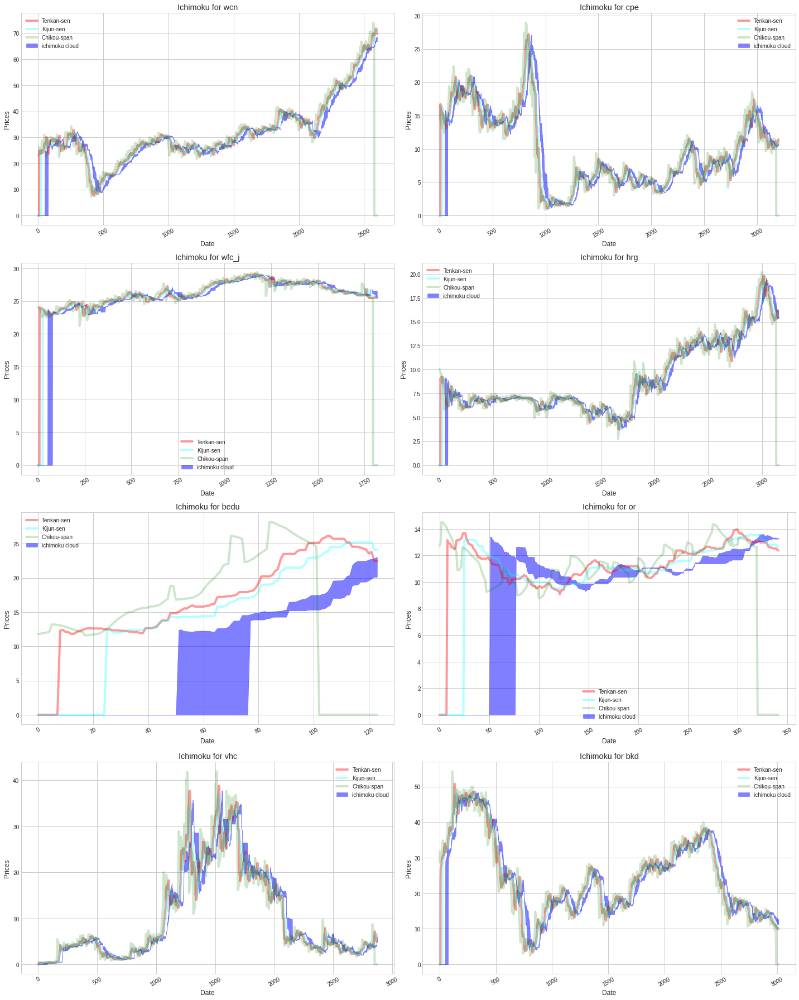

In [65]:
# ichimoku Plots turning_line	standard_line	ichimoku_span1	ichimoku_span2	chikou_span

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['ichimoku_span1'], TechIndicator[i]['ichimoku_span2'], 
                    color='blue', label = "ichimoku cloud", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['turning_line'], color='red', label = "Tenkan-sen", alpha = 0.4)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['standard_line'], color='cyan', label="Kijun-sen", alpha = 0.3)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['chikou_span'], color='green', label="Chikou-span", alpha = 0.2)
    ax.set_title("Ichimoku for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

## Calculation of William %R
%R = -100 * ( ( Highest High - Close) / ( Highest High - Lowest Low ) )

In [66]:
def WillR(df):
    highest_high = df['High'].rolling(window=14,center=False).max()
    lowest_low = df['Low'].rolling(window=14,center=False).min()
    df['WillR'] = (-100) * ((highest_high - df['Close']) / (highest_high - lowest_low))

In [67]:
for stock in range(len(TechIndicator)):
    WillR(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,TEMA,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,NATR,plusDI,minusDI,ADX,tp,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR
1814,2017-11-06,25.53,25.5600,25.51,25.485868,539979,0,wfc_j,41.666667,539979,25.523,25.555,25.491,36.0,-235.499017,25.5230,25.646401,25.409251,8.333333,14.236111,-3.431995,25.485868,-0.300951,25.982101,0.012131,14676.349359,-42.446401,-16735362,25.577435,25.521106,25.464778,0.382732,5.529746,1.566949,53.345985,25.518623,1.377952e+07,25.518623,0.000000,0.750168,42.862618,25.545,25.545,25.6150,26.59,0.0,-110.870495
1815,2017-11-07,25.52,25.5400,25.51,25.488751,241338,0,wfc_j,42.918455,241338,25.527,25.557,25.496,36.0,400.644002,25.5265,25.648401,25.411251,41.666667,23.958333,-3.121440,25.488751,0.152263,25.981707,0.011888,14681.612872,-68.311138,-16494024,25.575219,25.519055,25.462891,0.377326,4.792446,1.358022,53.678525,25.512917,6.157236e+06,0.000000,25.512917,0.555618,35.716886,25.545,25.545,25.6150,26.59,0.0,-108.653085
1816,2017-11-08,25.51,25.5400,25.51,25.491576,247629,0,wfc_j,44.943820,247629,25.528,25.557,25.499,36.0,-383.051007,25.5280,25.650401,25.413251,15.000000,21.666667,-1.468974,25.491576,0.149197,25.981304,0.011651,14686.786150,-56.805953,-16246395,25.573523,25.517359,25.461195,0.374101,4.153454,1.176953,53.966727,25.513859,6.317971e+06,25.513859,0.000000,0.750122,42.861137,25.545,25.545,25.6175,26.59,0.0,-106.480023
1817,2017-11-09,25.54,25.5499,25.51,25.494344,168372,0,wfc_j,32.258065,168372,25.530,25.557,25.503,36.0,193.914644,25.5300,25.653387,25.413762,20.000000,25.555556,-2.033813,25.494344,0.146193,25.981033,0.011418,14691.864050,-27.487582,-16078023,25.566951,25.516508,25.466065,0.356780,5.050867,1.020026,55.623988,25.518081,4.296530e+06,25.518081,0.000000,1.000235,50.005864,25.540,25.545,25.4950,26.59,0.0,-106.283944
1818,2017-11-10,25.56,25.5600,25.52,25.497058,180776,0,wfc_j,43.624161,180776,25.532,25.559,25.504,36.0,212.510972,25.5315,25.656389,25.414264,75.000000,36.666667,-1.752672,25.497058,0.143249,25.980749,0.011189,14696.844982,24.245035,-15897247,25.565147,25.516833,25.468519,0.335971,5.949475,0.884022,58.091029,25.525686,4.614431e+06,25.525686,0.000000,1.333753,57.150562,25.540,25.545,25.4950,26.59,0.0,-103.269376


### Calculation of MINMAX

In [68]:
def MINMAX(df):
    df['MIN_Volume'] = df['Volume'].rolling(window=14,center=False).min()
    df['MAX_Volume'] = df['Volume'].rolling(window=14,center=False).max()
    
for stock in range(len(TechIndicator)):
    MINMAX(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,TEMA,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,NATR,plusDI,minusDI,ADX,tp,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume
1814,2017-11-06,25.53,25.5600,25.51,25.485868,539979,0,wfc_j,41.666667,539979,25.523,25.555,25.491,36.0,-235.499017,25.5230,25.646401,25.409251,8.333333,14.236111,-3.431995,25.485868,-0.300951,25.982101,0.012131,14676.349359,-42.446401,-16735362,25.577435,25.521106,25.464778,0.382732,5.529746,1.566949,53.345985,25.518623,1.377952e+07,25.518623,0.000000,0.750168,42.862618,25.545,25.545,25.6150,26.59,0.0,-110.870495,61226.0,539979.0
1815,2017-11-07,25.52,25.5400,25.51,25.488751,241338,0,wfc_j,42.918455,241338,25.527,25.557,25.496,36.0,400.644002,25.5265,25.648401,25.411251,41.666667,23.958333,-3.121440,25.488751,0.152263,25.981707,0.011888,14681.612872,-68.311138,-16494024,25.575219,25.519055,25.462891,0.377326,4.792446,1.358022,53.678525,25.512917,6.157236e+06,0.000000,25.512917,0.555618,35.716886,25.545,25.545,25.6150,26.59,0.0,-108.653085,61226.0,539979.0
1816,2017-11-08,25.51,25.5400,25.51,25.491576,247629,0,wfc_j,44.943820,247629,25.528,25.557,25.499,36.0,-383.051007,25.5280,25.650401,25.413251,15.000000,21.666667,-1.468974,25.491576,0.149197,25.981304,0.011651,14686.786150,-56.805953,-16246395,25.573523,25.517359,25.461195,0.374101,4.153454,1.176953,53.966727,25.513859,6.317971e+06,25.513859,0.000000,0.750122,42.861137,25.545,25.545,25.6175,26.59,0.0,-106.480023,61226.0,539979.0
1817,2017-11-09,25.54,25.5499,25.51,25.494344,168372,0,wfc_j,32.258065,168372,25.530,25.557,25.503,36.0,193.914644,25.5300,25.653387,25.413762,20.000000,25.555556,-2.033813,25.494344,0.146193,25.981033,0.011418,14691.864050,-27.487582,-16078023,25.566951,25.516508,25.466065,0.356780,5.050867,1.020026,55.623988,25.518081,4.296530e+06,25.518081,0.000000,1.000235,50.005864,25.540,25.545,25.4950,26.59,0.0,-106.283944,61226.0,539979.0
1818,2017-11-10,25.56,25.5600,25.52,25.497058,180776,0,wfc_j,43.624161,180776,25.532,25.559,25.504,36.0,212.510972,25.5315,25.656389,25.414264,75.000000,36.666667,-1.752672,25.497058,0.143249,25.980749,0.011189,14696.844982,24.245035,-15897247,25.565147,25.516833,25.468519,0.335971,5.949475,0.884022,58.091029,25.525686,4.614431e+06,25.525686,0.000000,1.333753,57.150562,25.540,25.545,25.4950,26.59,0.0,-103.269376,61226.0,539979.0


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


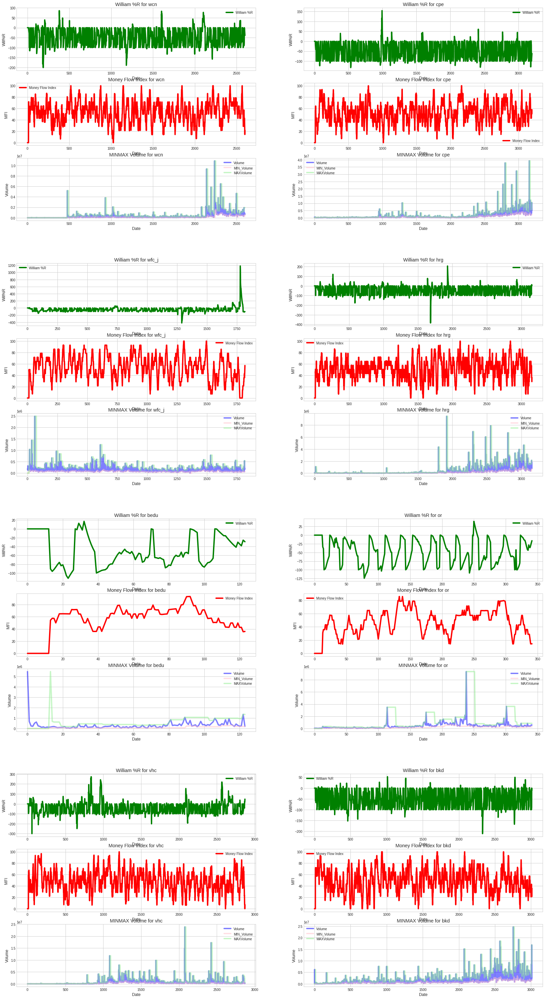

In [69]:
# William %R, Money Flow
fig = plt.figure(figsize=(25,50))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.2, hspace=0.2)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['WillR'], 'green', label="William %R")
            t = ax.set_title("William %R for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Will%R")
        elif j ==1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Money_Flow_Index'], 'red', label="Money Flow Index")
            
            t = ax.set_title("Money Flow Index for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("MFI")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume'], 'blue', label="Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MIN_Volume'], 'pink', label="MIN_Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MAX_Volume'], 'lightgreen', label="MAXVolume",  alpha = 0.5)
            t = ax.set_title("MINMAX Volume for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

## Calculation of MACD
MACD: (12-day EMA - 26-day EMA)

In [70]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['26_ema'] = TechIndicator[stock]['Close'].ewm(span=26,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['12_ema'] = TechIndicator[stock]['Close'].ewm(span=12,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['MACD'] = TechIndicator[stock]['12_ema'] - TechIndicator[stock]['26_ema']
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,TEMA,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,NATR,plusDI,minusDI,ADX,tp,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,26_ema,12_ema,MACD
1814,2017-11-06,25.53,25.5600,25.51,25.485868,539979,0,wfc_j,41.666667,539979,25.523,25.555,25.491,36.0,-235.499017,25.5230,25.646401,25.409251,8.333333,14.236111,-3.431995,25.485868,-0.300951,25.982101,0.012131,14676.349359,-42.446401,-16735362,25.577435,25.521106,25.464778,0.382732,5.529746,1.566949,53.345985,25.518623,1.377952e+07,25.518623,0.000000,0.750168,42.862618,25.545,25.545,25.6150,26.59,0.0,-110.870495,61226.0,539979.0,25.628859,25.499519,-0.129341
1815,2017-11-07,25.52,25.5400,25.51,25.488751,241338,0,wfc_j,42.918455,241338,25.527,25.557,25.496,36.0,400.644002,25.5265,25.648401,25.411251,41.666667,23.958333,-3.121440,25.488751,0.152263,25.981707,0.011888,14681.612872,-68.311138,-16494024,25.575219,25.519055,25.462891,0.377326,4.792446,1.358022,53.678525,25.512917,6.157236e+06,0.000000,25.512917,0.555618,35.716886,25.545,25.545,25.6150,26.59,0.0,-108.653085,61226.0,539979.0,25.618481,25.497862,-0.120619
1816,2017-11-08,25.51,25.5400,25.51,25.491576,247629,0,wfc_j,44.943820,247629,25.528,25.557,25.499,36.0,-383.051007,25.5280,25.650401,25.413251,15.000000,21.666667,-1.468974,25.491576,0.149197,25.981304,0.011651,14686.786150,-56.805953,-16246395,25.573523,25.517359,25.461195,0.374101,4.153454,1.176953,53.966727,25.513859,6.317971e+06,25.513859,0.000000,0.750122,42.861137,25.545,25.545,25.6175,26.59,0.0,-106.480023,61226.0,539979.0,25.609081,25.496895,-0.112185
1817,2017-11-09,25.54,25.5499,25.51,25.494344,168372,0,wfc_j,32.258065,168372,25.530,25.557,25.503,36.0,193.914644,25.5300,25.653387,25.413762,20.000000,25.555556,-2.033813,25.494344,0.146193,25.981033,0.011418,14691.864050,-27.487582,-16078023,25.566951,25.516508,25.466065,0.356780,5.050867,1.020026,55.623988,25.518081,4.296530e+06,25.518081,0.000000,1.000235,50.005864,25.540,25.545,25.4950,26.59,0.0,-106.283944,61226.0,539979.0,25.600582,25.496503,-0.104079
1818,2017-11-10,25.56,25.5600,25.52,25.497058,180776,0,wfc_j,43.624161,180776,25.532,25.559,25.504,36.0,212.510972,25.5315,25.656389,25.414264,75.000000,36.666667,-1.752672,25.497058,0.143249,25.980749,0.011189,14696.844982,24.245035,-15897247,25.565147,25.516833,25.468519,0.335971,5.949475,0.884022,58.091029,25.525686,4.614431e+06,25.525686,0.000000,1.333753,57.150562,25.540,25.545,25.4950,26.59,0.0,-103.269376,61226.0,539979.0,25.592913,25.496588,-0.096325


## Calculation of Adaptive Moving Average

In [71]:
def KAMA(price, n=10, pow1=2, pow2=30):
    ''' kama indicator '''    
    ''' accepts pandas dataframe of prices '''

    absDiffx = abs(price - price.shift(1) )  

    ER_num = abs( price - price.shift(n) )
    ER_den = absDiffx.rolling(window=n,center=False).sum()
    ER = ER_num / ER_den

    sc = ( ER*(2.0/(pow1+1)-2.0/(pow2+1.0))+2/(pow2+1.0) ) ** 2.0


    answer = np.zeros(sc.size)
    N = len(answer)
    first_value = True

    for i in range(N):
        if sc[i] != sc[i]:
            answer[i] = np.nan
        else:
            if first_value:
                answer[i] = price[i]
                first_value = False
            else:
                answer[i] = answer[i-1] + sc[i] * (price[i] - answer[i-1])
    return answer

In [72]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['KAMA'] = KAMA(TechIndicator[stock]['Close'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[4].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,TEMA,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,NATR,plusDI,minusDI,ADX,tp,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,26_ema,12_ema,MACD,KAMA
119,2017-11-06,24.00,24.91,23.97,25.478680,298738,0,bedu,27.054912,298738,25.090,26.643,23.537,-32.0,1349.554098,25.090,28.959054,21.656029,58.385093,38.516114,-3.106358,25.478680,-9.515305,18.866088,-0.917635,15069.946071,-51.550181,10113377,26.744239,25.345404,23.946568,12.693096,7.300644,7.429834,23.911007,24.786227,7.404588e+06,24.786227,0.000000,0.988785,49.718046,24.1405,25.1956,22.490000,19.420,0.0,-30.162845,188670.0,981019.0,25.143167,26.118156,0.974989,25.797280
120,2017-11-07,24.66,24.83,23.83,25.282620,218485,0,bedu,33.738385,218485,24.946,26.469,23.423,-32.0,-11752.716497,24.946,28.744132,21.581107,13.509317,35.093495,-3.092519,25.282620,-9.579892,18.897008,-0.862577,14691.345596,-57.152343,9894892,26.488106,25.223556,23.959006,12.443655,6.327224,7.032520,21.426774,24.647540,5.385118e+06,0.000000,24.647540,0.738992,42.495410,23.5605,25.1956,22.677500,19.630,0.0,-34.353074,188670.0,943680.0,25.153498,25.989612,0.836114,25.568542
121,2017-11-08,24.00,24.29,23.86,25.098322,256873,0,bedu,27.578125,256873,24.818,26.283,23.353,-32.0,9401.465450,24.818,28.514702,21.535477,32.169118,34.687843,-3.446566,25.098322,-9.628637,18.931232,-0.810822,14340.658960,-68.486530,9638019,26.140019,25.104040,24.068062,11.533943,5.483594,6.094851,19.273772,24.416107,6.271839e+06,0.000000,24.416107,0.745131,42.697724,23.7900,25.1956,22.777500,19.880,0.0,-38.291890,188670.0,943680.0,25.149411,25.852490,0.703080,25.359555
122,2017-11-09,23.38,23.38,20.00,24.925083,1355953,0,bedu,21.739130,1355953,24.574,26.242,22.906,-32.0,-183994.926758,24.574,28.525673,21.120198,-38.594705,2.361243,-2.770273,24.925083,-9.662701,19.024238,-0.762173,14015.831741,-153.113855,8282066,26.019633,24.805083,23.590533,12.459592,4.752448,21.854614,25.274175,22.768361,3.087283e+07,0.000000,22.768361,0.549204,35.450739,22.4550,24.0901,22.855525,20.125,0.0,-25.602974,188670.0,1355953.0,25.132792,25.709812,0.577020,25.166457
123,2017-11-10,21.39,21.98,21.39,24.531076,199906,0,bedu,20.169728,199906,24.313,26.052,22.574,-72.0,183641.271565,24.313,28.218935,20.980960,-18.219462,-8.215016,-2.884014,24.531076,-10.526319,19.037397,-0.947604,13517.144220,-134.785065,8082160,25.696268,24.519575,23.342882,12.972377,4.118788,18.940665,30.474525,22.633692,4.524611e+06,0.000000,22.633692,0.559175,35.863530,22.4550,24.0901,23.062750,20.125,0.0,-29.091135,188670.0,1355953.0,25.088218,25.528468,0.440251,24.884065


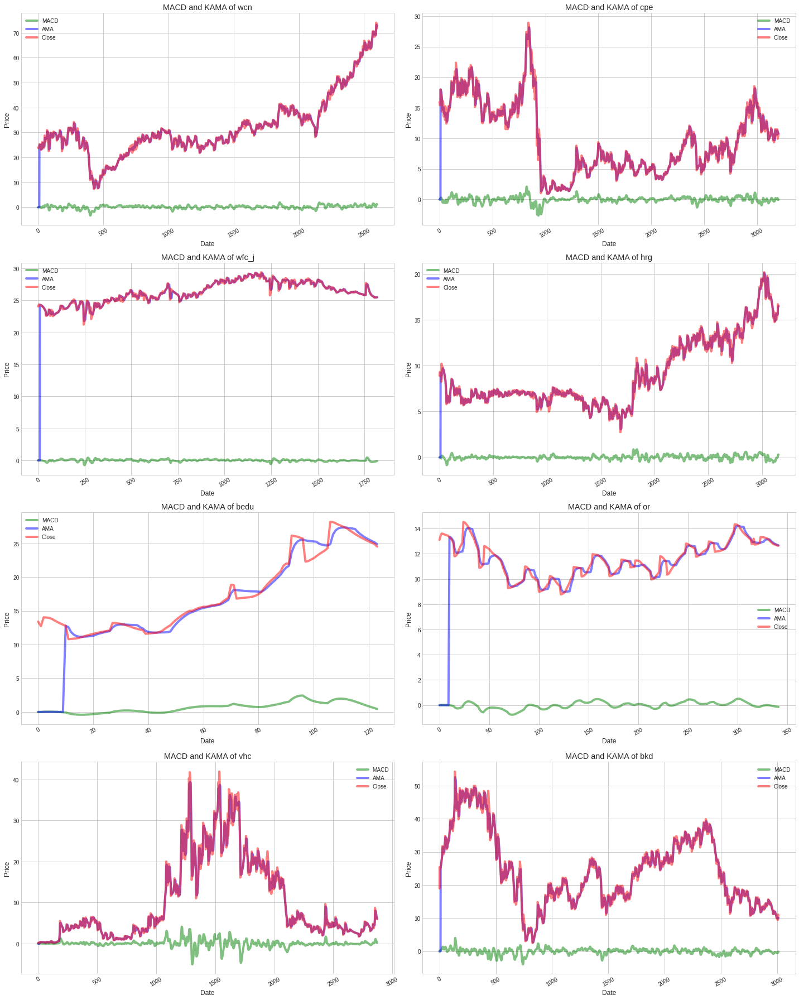

In [73]:
# Moving Average Convergence Divergence, Adaptive Moving Avergae Plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['MACD'], 'green', label="MACD", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['KAMA'], 'blue', label="AMA", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'red', label="Close", alpha = 0.5)
    ax.set_title("MACD and KAMA of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

### Drop Unwanted Columns

In [74]:
columns2Drop = ['26_ema', '12_ema','tp','rmf','pmf','nmf','mfr']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,TEMA,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,NATR,plusDI,minusDI,ADX,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,MACD,KAMA
0,2010-08-23,24.142,24.209,24.081,24.081,190437,0,wfc_j,0.0,190437,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,24.081,0.0,24.145000,0.000,12297.000240,0.0,190437,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.097031,0.0,0.0,0.0,0.000000,0.0
1,2010-08-24,24.116,24.175,24.047,24.149,137529,0,wfc_j,0.0,137529,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,24.149,0.0,24.130742,0.000,12369.594264,0.0,327966,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.070670,0.0,0.0,0.0,0.001526,0.0
2,2010-08-25,24.149,24.312,24.098,24.209,156536,0,wfc_j,0.0,156536,0.0,0.0,0.0,0.0,506.173667,0.0,0.0,0.0,0.000000,0.0,0.0,24.209,0.0,24.154734,0.000,12445.541852,0.0,484502,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.045363,0.0,0.0,0.0,0.003805,0.0
3,2010-08-26,24.287,24.380,24.081,24.098,318588,0,wfc_j,0.0,318588,0.0,0.0,0.0,0.0,-2704.762092,0.0,0.0,0.0,21.696697,0.0,0.0,24.098,0.0,24.184791,0.000,12380.722007,0.0,165914,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.021068,0.0,0.0,0.0,0.000740,0.0
4,2010-08-27,23.661,23.953,23.661,24.380,181739,0,wfc_j,0.0,181739,0.0,0.0,0.0,0.0,-372.229833,0.0,0.0,0.0,-15.681502,0.0,0.0,24.380,0.0,24.115074,0.299,12586.296795,0.0,347653,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23.983564,0.0,0.0,0.0,0.010281,0.0
